# SOME LOW LEVEL IMAGE PROCESSING METHODS
This workbook demonstrates some low level image processing techniques such as,  
1. Image Blurring
2. Image thresholding
3. Contrast Stretching
4. Bit-Plane Slicing
5. Histogram Equalization

In [353]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [354]:
from PIL import Image

In [355]:
from tqdm import tqdm

#### OBTAIN ALL IMAGES LOCATION
Using **Glob** retrieve all images paths.

In [356]:
import glob
images=glob.glob(pathname='Images/*.jpg',recursive=True)

In [357]:
images

['Images/LowContrast_img2.jpg',
 'Images/dog.jpg',
 'Images/lena.jpg',
 'Images/LowContrast_img4.jpg',
 'Images/rugby.jpg',
 'Images/LowContrast_img5.jpg',
 'Images/imagesample.jpg',
 'Images/Noisy_img_2.jpg',
 'Images/woods.jpg',
 'Images/flower.jpg',
 'Images/human.jpg',
 'Images/elephants.jpg']

In [6]:
img1=Image.open(images[7])
print(f"The img is in {img1.mode} having size of {img1.size}")

The img is in RGB having size of (480, 640)


In [7]:
img1.show()

## IMAGE BLURRING
Intensity transformation & Spatial filtering are **Spatial Domain** techniques that applies on pixels i.e. on the img space.  

**IMAGE BLURRING** technique is one such that for any pixel at (x,y) computes the avg intensity considering a certain neighbourhood of it (2x2/3x3 etc.) and replaces it as the pixel value in the output img at (x,y) results in blurred img.  

Here 3x3 ngb is considered.  

Since image considered is RGB extraction of any one band is done following which blurring is performed.

In [8]:
import random
from time import sleep

In [9]:
def Filling_PaddedImage(img_padded,img,rows,cols):
    
    for r in range(1,rows+1):
        for c in range(1,cols+1):
            img_padded[r,c]=img[r-1,c-1]
    
    return img_padded

In [10]:
def Blurring_Image(img_padded,rows,cols):
    for r in tqdm(range(1,rows+1)):
        for c in range(1,cols+1):
            img_padded[r,c]=np.average([img_padded[r,c-1],img_padded[r,c+1],img_padded[r-1,c],img_padded[r+1,c],img_padded[r-1,c-1],img_padded[r+1,c+1],img_padded[r+1,c-1],img_padded[r-1,c+1]])
    return img_padded

In [11]:
def Blur_grayscale_img():
    #choose image randomly & open 
    # random_img_choice=random.randint(0,len(images)-1)
    random_img_choice=7
    img=Image.open(images[random_img_choice])

    img=np.asarray(img)

    try:
        rows,cols,channels=img.shape
    except:
        channels=0
        rows,cols,=img.shape

    #Since 3x3 ngb is considered img is padded with 0s along its periphery
    #If RGB image provided it's converted to grayscale
    if channels==3:
        img_r,img_g,img_b=img[:,:,0],img[:,:,1],img[:,:,2]
        img=0.2989*img_r+0.5870*img_g+0.1140*img_b

    img_padded=np.zeros((rows+2,cols+2))
    
    img_padded=Filling_PaddedImage(img_padded,img,rows,cols)
    img_padded=Blurring_Image(img_padded,rows,cols)

    img_blurred=Image.fromarray(img_padded)

    #convert image to either Grayscale or RGB
    img_blurred=img_blurred.convert("L")

    #display blurred & original images
    original_img=Image.open(images[random_img_choice])
    original_img.show()
    img_blurred.show()

    blurred_imgs_saved=glob.glob(pathname='**/Blurred_*.jpg',recursive=True)

    if not('Results'+'/'+'Blurred_'+images[random_img_choice].split('/')[-1] in blurred_imgs_saved):
        img_blurred.save('Results'+'/'+'Blurred_'+images[random_img_choice].split('/')[-1])

In [175]:
Blur_grayscale_img()

100%|██████████| 640/640 [00:01<00:00, 623.35it/s]


## IMAGE NEGATIVE
This method is used to highlight region of interest in an image whilst keeping the rest of image regions as is and is extensively used in medical image processing techniques.

In [12]:
def Get_Negative_Image():
    random_img_choice=random.randint(0,len(images)-1)
    img=Image.open(images[random_img_choice])

    img=np.asarray(img)

    try:
        rows,cols,channels=img.shape
    except:
        channels=0
        rows,cols,=img.shape

    #Since 3x3 ngb is considered img is padded with 0s along its periphery
    #If RGB image provided it's converted to grayscale
    if channels==3:
        img_r,img_g,img_b=img[:,:,0],img[:,:,1],img[:,:,2]
        img=0.2989*img_r+0.5870*img_g+0.1140*img_b

    img_negative=np.zeros((rows,cols))

    #create img negative
    for r in tqdm(range(rows)):
        for c in range(cols):
            img_negative[r,c]=img.max()-img[r,c]
    
    #display original & its negative
    original_img=Image.open(images[random_img_choice])
    img_negative=Image.fromarray(img_negative)

    #convert floating grayscale values to grayscale or RGB 
    img_negative=img_negative.convert("L")

    original_img.show()
    img_negative.show()

    negatives_img_saved=glob.glob(pathname='**/Negative_*.jpg',recursive=True)

    if not('Results'+'/'+'Negative_'+images[random_img_choice].split('/')[-1] in negatives_img_saved):
        img_negative.save('Results'+'/'+'Negative_'+images[random_img_choice].split('/')[-1])

In [169]:
Get_Negative_Image()

100%|██████████| 640/640 [00:09<00:00, 66.70it/s]


## BIT-LEVEL SLICING
For grayscale images each pixel has intensity which are stored in bits. Usually the number of bits is 8 for most images. Given an image size of M x N where M - number of rows  
and N - number of columns with b - number of bits used to represent each intensity/gray level values, the storage size needed for such image is MxNxb bits.  

For high resolution images M,N being quite high the storage size becomes large. **IMAGE COMPRESSION** is one area under Image Processing that helps store such high resolution  
images in small storages without much loss in image quality.  

Compressing image means reduction in either M,N or b. It is observed that reduction of either M or N leads to **FALSE CONTOURING** in images that gives the appearance of **checkered box** as in chess board. Hence the other option is to optimise b such that not much image quality loss is encountered while reducing img size.  

**BIT-LEVEL SLICING** shows how different bit-planes capture image information. It is usually seen that the MSB bit-plane contains the most level of info while the LSB bit-plane contains the least.

In [113]:
def Bit_slice_img(img,rows,cols):
    
    #find number of bits
    num_bits=0
    max_intensity=img.max()

    #here num_bits acts as the length of every string
    while max_intensity>1:
        max_intensity=max_intensity/2
        num_bits+=1
    
    # print(num_bits)
    
    #convert every gray level/intenity value to its binary & store in a list of strings
    bits_stored=[]

    for r in tqdm(range(rows)):
        bits_stored.append([])

        for c in range(cols):
            res=bin(img[r,c])[2:]

            if len(res)<num_bits:
                res='0'*(num_bits-len(res))+res
            bits_stored[r].append(res)

    #create bit planes for each image
    img_bitplanes=np.zeros((rows,cols,num_bits))

    
    for r in tqdm(range(rows)):
        for c in range(cols):
            bitplane_pos=0
            while bitplane_pos<num_bits:
                img_bitplanes[r,c,bitplane_pos]=(int(bits_stored[r][c][bitplane_pos]))*255
                bitplane_pos+=1
    
    return (img_bitplanes,num_bits)

In [124]:
def Bit_Level_Slicing():
    # random_choice=random.randint(0,len(images)-1)
    random_choice=4
    img=Image.open(images[random_choice])

    img=np.asarray(img)

    try:
        rows,cols,channels=img.shape
    except:
        channels=0
        rows,cols,=img.shape
    
    #convert RGB to Grayscale
    if channels:
        img_r,img_g,img_b=img[:,:,0],img[:,:,1],img[:,:,2]
        img=0.2989*img_r+0.5870*img_g+0.1140*img_b

    img=img.astype(np.int64)
    
    img_sliced_bitplanewise,channels=Bit_slice_img(img,rows,cols)

    #check out first 2 bit-planes
    img_first_bitplane=img_sliced_bitplanewise[:,:,channels-1]
    img_sec_bitplane=img_sliced_bitplanewise[:,:,channels-2]
    img_third_bitplane=img_sliced_bitplanewise[:,:,channels-3]
    img_fourth_bitplane=img_sliced_bitplanewise[:,:,channels-4]
    img_fifth_bitplane=img_sliced_bitplanewise[:,:,channels-5]
    img_sixth_bitplane=img_sliced_bitplanewise[:,:,channels-6]
    img_seventh_bitplane=img_sliced_bitplanewise[:,:,channels-7]
    img_eighth_bitplane=img_sliced_bitplanewise[:,:,channels-8]

    #convert numpy to PIL image
    img_first_bitplane=Image.fromarray(img_first_bitplane)
    img_sec_bitplane=Image.fromarray(img_sec_bitplane)
    img_third_bitplane=Image.fromarray(img_third_bitplane)
    img_fourth_bitplane=Image.fromarray(img_fourth_bitplane)
    img_fifth_bitplane=Image.fromarray(img_fifth_bitplane)
    img_sixth_bitplane=Image.fromarray(img_sixth_bitplane)
    img_seventh_bitplane=Image.fromarray(img_seventh_bitplane)
    img_eighth_bitplane=Image.fromarray(img_eighth_bitplane)

    #open & display images
    original_img=Image.open(images[random_choice])
    # img_first_bitplane=Image.open(img_first_bitplane)

    # original_img.show()
    # img_first_bitplane.show()
    # img_sec_bitplane.show()
    # img_third_bitplane.show()
    # img_fourth_bitplane.show()
    # img_fifth_bitplane.show()
    # img_sixth_bitplane.show()
    # img_seventh_bitplane.show()
    # img_eighth_bitplane.show()

    #save original & bit-plane images
    path=os.getcwd()
    all_dirs_with_bitplane_imgs=[name for name in os.listdir(path+'/'+'Results') if os.path.isdir(os.path.join(path+'/'+'Results',images[random_choice].split('.')[0].split('/')[-1]))]

    #checks if dir exists in which case creates a directory and stores original & bit-plane slices images in it
    if images[random_choice].split('.')[0].split('/')[-1] not in all_dirs_with_bitplane_imgs:
        os.makedirs(path+'/'+'Results'+'/'+images[random_choice].split('.')[0].split('/')[-1],exist_ok=True)

        #convert all imgs to grayscale prior to saving since PIL do not save images with floating grayvalues
        original_img=original_img.convert("L")
        img_first_bitplane=img_first_bitplane.convert("L")
        img_sec_bitplane=img_sec_bitplane.convert("L")
        img_third_bitplane=img_third_bitplane.convert("L")
        img_fourth_bitplane=img_fourth_bitplane.convert("L")
        img_fifth_bitplane=img_fifth_bitplane.convert("L")
        img_sixth_bitplane=img_sixth_bitplane.convert("L")
        img_seventh_bitplane=img_seventh_bitplane.convert("L")
        img_eighth_bitplane=img_eighth_bitplane.convert("L")

        original_img.save('Results'+'/'+images[random_choice].split('.')[0].split('/')[-1]+'/'+'Original_'+images[random_choice].split('/')[-1])
        img_first_bitplane.save('Results'+'/'+images[random_choice].split('.')[0].split('/')[-1]+'/'+'BottomPlane_'+images[random_choice].split('/')[-1])
        img_sec_bitplane.save('Results'+'/'+images[random_choice].split('.')[0].split('/')[-1]+'/'+'SecondBottomPlane_'+images[random_choice].split('/')[-1])
        img_third_bitplane.save('Results'+'/'+images[random_choice].split('.')[0].split('/')[-1]+'/'+'ThirdBottomPlane_'+images[random_choice].split('/')[-1])
        img_fourth_bitplane.save('Results'+'/'+images[random_choice].split('.')[0].split('/')[-1]+'/'+'FourthBottomPlane_'+images[random_choice].split('/')[-1])
        img_fifth_bitplane.save('Results'+'/'+images[random_choice].split('.')[0].split('/')[-1]+'/'+'FifthBottomPlane_'+images[random_choice].split('/')[-1])
        img_sixth_bitplane.save('Results'+'/'+images[random_choice].split('.')[0].split('/')[-1]+'/'+'ThirdFromTopPlane_'+images[random_choice].split('/')[-1])
        img_seventh_bitplane.save('Results'+'/'+images[random_choice].split('.')[0].split('/')[-1]+'/'+'SecondFromTopPlane_'+images[random_choice].split('/')[-1])
        img_eighth_bitplane.save('Results'+'/'+images[random_choice].split('.')[0].split('/')[-1]+'/'+'TopPlane_'+images[random_choice].split('/')[-1])

In [110]:
Bit_Level_Slicing()

100%|██████████| 5184/5184 [00:30<00:00, 168.95it/s]


From above images it is observed that the firsy couple of bit-planes contains the most information. Hence if combined will result in an image that replicates to a large extent the original image and could therefore help in reducing its size & facilitate easy storage.

In [173]:
def ImageCompression():
    path=os.getcwd()
    all_bitplane_imgs_dir=[dir for dir in os.listdir(path+'/'+'Results') if os.path.isdir(os.path.join(path+'/'+'Results',dir))]

    choice=random.randint(0,len(all_bitplane_imgs_dir)-1)

    #here the top & the second from top bitplanes are combined
    dir_picked=all_bitplane_imgs_dir[choice]

    original_img=Image.open('Results'+'/'+dir_picked+'/'+'Original_'+dir_picked+'.jpg')
    top_plane_img=Image.open('Results'+'/'+dir_picked+'/'+'TopPlane_'+dir_picked+'.jpg')
    sec_top_plane_img=Image.open('Results'+'/'+dir_picked+'/'+'SecondFromTopPlane_'+dir_picked+'.jpg')
    third_top_plane_img=Image.open('Results'+'/'+dir_picked+'/'+'ThirdFromTopPlane_'+dir_picked+'.jpg')
    fourth_top_plane_img=Image.open('Results'+'/'+dir_picked+'/'+'FifthBottomPlane_'+dir_picked+'.jpg')
    fifth_top_plane_img=Image.open('Results'+'/'+dir_picked+'/'+'FourthBottomPlane_'+dir_picked+'.jpg')
    # Sixth_top_plane_img=Image.open('Results'+'/'+dir_picked+'/'+'ThirdBottomPlane_'+dir_picked+'.jpg')
    # Seventh_top_plane_img=Image.open('Results'+'/'+dir_picked+'/'+'SecondBottomPlane_'+dir_picked+'.jpg')
    # Bottom_plane_img=Image.open('Results'+'/'+dir_picked+'/'+'BottomPlane_'+dir_picked+'.jpg')
    
    #convert plane-wise images to bit-images
    top_plane_bitimg=np.asarray(top_plane_img)*(1/255)
    sec_top_plane_bitimg=np.asarray(sec_top_plane_img)*(1/255)
    third_top_plane_img=np.asarray(third_top_plane_img)*(1/255)
    fourth_top_plane_img=np.asarray(fourth_top_plane_img)*(1/255)
    fifth_top_plane_img=np.asarray(fifth_top_plane_img)*(1/255)
    # Sixth_top_plane_img=np.asarray(Sixth_top_plane_img)
    # Seventh_top_plane_img=np.asarray(Seventh_top_plane_img)
    # Bottom_plane_img=np.asarray(Bottom_plane_img)

    #reconstructing original img by converting top 2 bitplanes to decimal
    top_two_result=top_plane_bitimg*pow(2,7)+sec_top_plane_bitimg*pow(2,6)
    top_three_result=top_plane_bitimg*pow(2,7)+sec_top_plane_bitimg*pow(2,6)+third_top_plane_img*pow(2,5)
    top_four_result=top_plane_bitimg*pow(2,7)+sec_top_plane_bitimg*pow(2,6)+third_top_plane_img*pow(2,5)+fourth_top_plane_img*pow(2,4)
    top_five_result=top_plane_bitimg*pow(2,7)+sec_top_plane_bitimg*pow(2,6)+third_top_plane_img*pow(2,5)+fourth_top_plane_img*pow(2,4)+fifth_top_plane_img*pow(2,3)

    #horizontal stacking images
    result=np.hstack((top_two_result,top_three_result,top_four_result,top_five_result))
    
    #convert to PIL and display both original, top-2,top-3,top-4 & top-5 planes combined images
    result=Image.fromarray(result)

    # print(result.mode,result.size,result.format)
    original_img.show()
    result.show()

    #save img
    all_imgs_in_dir=os.listdir(path+'/'+'Results'+'/'+dir_picked)

    if dir_picked+'_ImgReconstructionWithTop5Planes'+'.jpg' not in all_imgs_in_dir:
        #convert img to grayscale from floating point grayscale
        result=result.convert("L")
        result.save('Results'+'/'+dir_picked+'/'+dir_picked+'_ImgReconstructionWithTop5Planes'+'.jpg')

In [184]:
ImageCompression()

F (13824, 5184) None


## CONTRAST ENHANCEMENT
Images may suffer from poor contrast. Some images may look whitewashed while others completely black.These images have non-uniform distribution of pixels of specific grayscale values across that leads to poor contrast. Good contrast images are those with nearly uniform distribution of pixels across different grayscales and has grayscales that touch all possible values i.e. [0,255]. 

**HISTOGRAM EQUALISATION** is a method that aims to achieve good contrast with imgs that have poor contrast.

In [301]:
def Histogram_Equalise_Low_Contrast_Image():
    #get list of low contrast imgs
    lowcontrast_img_lst=glob.glob(pathname="Images/Low*.*",recursive=True)

    #make a random img location choice
    choice=random.randint(0,len(lowcontrast_img_lst)-1)
    low_contrast_img_path=lowcontrast_img_lst[choice]

    #plot its pixel distribution in the form of a histogram
    img=Image.open("Images/Test_img.png")

    #convert img to numpy array
    img=np.asarray(img)
    prob_dist_of_pixels_in_orig_img={}
    
    try:
        rows,cols,channels=img.shape
    except:
        channels=0
        rows,cols=img.shape
    
    if channels==3:
        img_r,img_g,img_b=img[:,:,0],img[:,:,1],img[:,:,2]
        img=0.2989*img_r+0.5870*img_g+0.1140*img_b

    img=img.astype(np.int64)

    for r in tqdm(range(rows)):
        for c in range(cols):
            if img[r,c] not in prob_dist_of_pixels_in_orig_img:
                prob_dist_of_pixels_in_orig_img[img[r,c]]=0
            prob_dist_of_pixels_in_orig_img[img[r,c]]+=1

    #Perform histogram equalisation
    total_pixels=rows*cols

    for k in prob_dist_of_pixels_in_orig_img:
        prob_dist_of_pixels_in_orig_img[k]/=total_pixels
    
    #plot pixel prob distribution across various grayscales and show associated img
    fig,axes=plt.subplots(2,2,figsize=(15,15))

    axes[0,0].bar(list(prob_dist_of_pixels_in_orig_img.keys()),list(prob_dist_of_pixels_in_orig_img.values()),color="red")
    axes[0,0].set_xlabel("Grayscale values")
    axes[0,0].set_ylabel("Number of pixels")
    axes[0,0].set_title("Probability distribution of pixels across different grayscales")
    axes[0,1].imshow(img,cmap="gray")
    axes[0,1].set_title("Original image")
    axes[0,1].axis('off')
    # plt.show()

    # Find redistribution of every grayvalues in original img, plot pdf & show histogram equalised img
    grayvalues_ordered=sorted(list(prob_dist_of_pixels_in_orig_img.keys()))

    map_ordered_pixelvalues_to_its_freq=[]

    for grayval in grayvalues_ordered:
        map_ordered_pixelvalues_to_its_freq.append([grayval,prob_dist_of_pixels_in_orig_img[grayval]])
    
    # print(map_ordered_pixelvalues_to_its_freq)

    grayscale_redistributed={}
    sum_of_pixels_prob=0
    for item in map_ordered_pixelvalues_to_its_freq:
        sum_of_pixels_prob+=item[1]
        grayscale_redistributed[item[0]]=round(sum_of_pixels_prob*255)
    
    # print(grayscale_redistributed)
    prob_dist_of_pixels_in_histequalized_img={}

    for orig_grayscale in grayscale_redistributed:
        if grayscale_redistributed[orig_grayscale] not in prob_dist_of_pixels_in_histequalized_img:
            prob_dist_of_pixels_in_histequalized_img[grayscale_redistributed[orig_grayscale]]=0
        prob_dist_of_pixels_in_histequalized_img[grayscale_redistributed[orig_grayscale]]+=1


    for mapped_grayscale in prob_dist_of_pixels_in_histequalized_img:
        prob_dist_of_pixels_in_histequalized_img[mapped_grayscale]/=(rows*cols)

    #plot prob distribution of pixels in histogram equalised image
    axes[1,0].bar(list(prob_dist_of_pixels_in_histequalized_img.keys()),list(prob_dist_of_pixels_in_histequalized_img.values()),color="red")
    axes[1,0].set_xlabel("Grayscale values")
    axes[1,0].set_ylabel("Prob of pixels")
    axes[1,0].set_title("Probability distribution function of pixels in histogram equalised image")
                        
    #get the histogram equalised image
    hist_eq_img=img
    for r in tqdm(range(rows)):
        for c in range(cols):
            hist_eq_img[r,c]=grayscale_redistributed[hist_eq_img[r,c]]

    axes[1,1].imshow(hist_eq_img,cmap='gray')
    axes[1,1].set_title('Histogram Equalised Image')
    axes[1,1].axis('off')
    plt.show()

100%|██████████| 1024/1024 [00:00<00:00, 5406.53it/s]


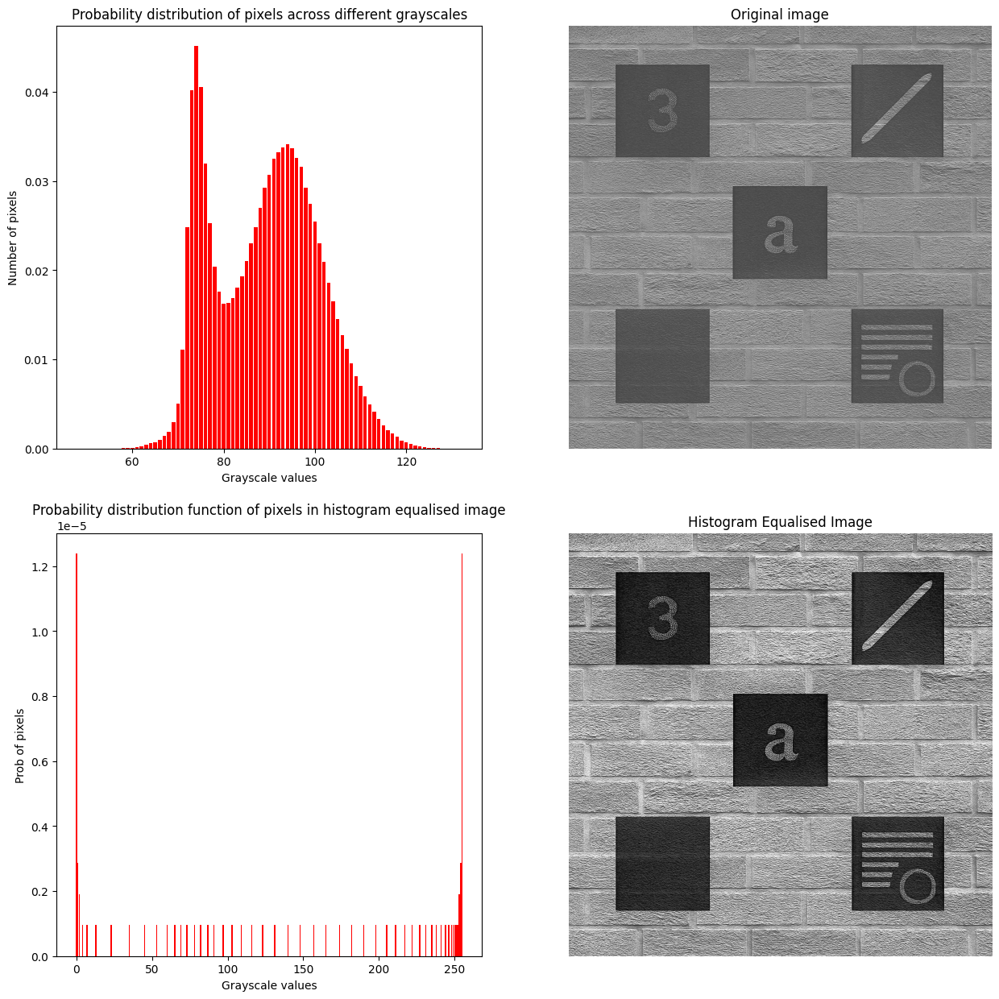

In [304]:
Histogram_Equalise_Low_Contrast_Image()

## LOCAL HISTOGRAM PROCESSING
As opposed to **Global Histogram Equalisation** **Local Histogram Equalisation** is performed on neighbourhood of each pixel to have local contrast enhancement. Although computationally inefficient as compared to global method, local method produces better enhancement.  

Here for every pixel a neighbourhood of 8 pixels is considered to perform histogram equalisation & redistribute input pixel intensity.

In [277]:
def Form_loc_hist_eq_img(img,row,col):

    #perform hist equalization with the centre & its 8-ngb pixels
    total_pixels=0
    prob_dist_of_pixels={}

    for r in range(max(0,row-1),row+1):
        for c in range(max(0,col-1),col+1):
            if img[r,c] not in prob_dist_of_pixels:
                prob_dist_of_pixels[img[r,c]]=0
            prob_dist_of_pixels[img[r,c]]+=1
            total_pixels+=1

    for grayscale in prob_dist_of_pixels:
        prob_dist_of_pixels[grayscale]/=total_pixels
    
    grayscales_ordered=sorted(list(prob_dist_of_pixels.keys()))

    #find redistributed grayscale values for each pixel & replace redistributed grayscale at row,col to corresponding loc in the output image
    redis_grayscales={}
    cum_sum=0
    for intensity in grayscales_ordered:
        cum_sum+=prob_dist_of_pixels[intensity]
        redis_grayscales[intensity]=round(cum_sum*255)

    return redis_grayscales[img[row,col]]

In [278]:
def Local_Histogram_Processed_Image(img,rows,cols):

    loc_hist_eq_img=np.zeros((rows,cols))
    
    for r in tqdm(range(rows)):
        for c in range(cols):
            loc_hist_eq_img[r,c]=Form_loc_hist_eq_img(img,r,c)
    
    return loc_hist_eq_img

In [302]:
def Local_Histogram_Processing():
    img_list=glob.glob(pathname="Images/Low*.*",recursive=True)
    choice=random.randint(0,len(img_list)-1)

    img_path=img_list[choice]
    
    #open img as PIL
    img=Image.open("Images/Test_img.png")

    #convert img to numpy
    img=np.asarray(img)

    try:
        rows,cols,channels=img.shape
    except:
        channels=0
        rows,cols=img.shape
    
    #convert RGB image to grayscale
    if channels==3:
        img_r,img_g,img_b=img[:,:,0],img[:,:,1],img[:,:,2]
        img=0.2989*img_r+0.5870*img_g+0.1140*img_b
    
    #convert any floating point grayscales to integers
    img=img.astype(np.int64)

    #Perform Local histogram processing
    local_hist_img=Local_Histogram_Processed_Image(img,rows,cols)

    #plot image
    fig,axes=plt.subplots(1,2,figsize=(15,15))

    axes[0].imshow(img,cmap='gray')
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    axes[1].imshow(local_hist_img,cmap='gray')
    axes[1].set_title("Local histogram processed image with max 8-ngb")
    axes[1].axis('off')
    
    plt.show()

100%|██████████| 1024/1024 [00:02<00:00, 344.58it/s]


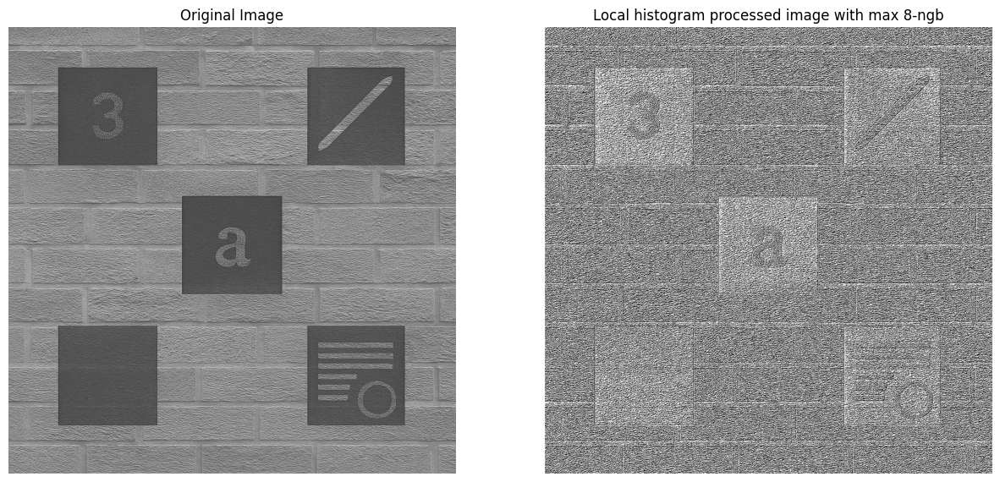

In [303]:
Local_Histogram_Processing()

### SMOOTHING
**NOISE** in image is quite common. There exists different types of noises such as **Impulse noise** etc.  

Under such circumstances smoothing filters play a significant role to remove such noises. Some smoothing filters include but are not limited to,  
1. Box-filters
2. Gaussian filters
3. Median filters
4. Max filters 
5. Min filters etc.  

**Smoothing** in general is achieved by replacing pixel intensity at every location in an image f(x,y) some average of pixel values in the neighbourhood.  

The first 2 filters are linear filters meaning for computing pixel intensity at every location a SOP(Sum Of Product) of pixel values depending on the kernel size is computed.**BOX FILTERS** assign equal weight to all pixels in the ngb of the centre pixel whose intensity is replaced while for **GAUSSIAN FILTERS** the weights reduce with increase in distance from the centre pixel.  

Whereas **BOX FILTER KERNELS** produce non-uniform smoothing **GAUSSIAN FILTER KERNELS** form uniform smoothing.  

The remaining 3 filters come under **NON-LINEAR FILTERS** with **Median** being useful against **salt & pepper noise in image** while **max** and **min** filters used to identify bright & dark spots in images.

In [311]:
def Convolution(img,kernel,rows,cols):
    #pad image with zero-padding
    padded_img=np.zeros((rows+2,cols+2))

    # for r in tqdm(range(1,rows+1)):
    #     for c in range(1,cols+1):
    #         padded_img[r,c]=img[r-1,c-1]
    padded_img=Filling_PaddedImage(padded_img,img,rows,cols)
    
    smoothed_img=padded_img
    
    for r in tqdm(range(1,rows+1)):
        for c in range(1,cols+1):
            smoothed_img[r,c]=kernel[0,0]*padded_img[r-1,c-1]+kernel[0,1]*padded_img[r-1,c]+kernel[0,2]*padded_img[r-1,c+1]+kernel[1,0]*padded_img[r,c-1]+kernel[1,1]*padded_img[r,c]+kernel[1,2]*padded_img[r,c+1]+kernel[2,0]*padded_img[r+1,c-1]+kernel[2,1]*padded_img[r+1,c]+kernel[2,2]*padded_img[r+1,c+1]
    
    return smoothed_img

In [346]:
def Non_linear_filtration(img,rows,cols):
    #pad image with zero-padding
    padded_img=np.zeros((rows+2,cols+2))

    padded_img=Filling_PaddedImage(padded_img,img,rows,cols)

    #final img to be stored in smoothed_img
    smoothed_img=padded_img

    for r in tqdm(range(1,rows+1)):
        for c in range(1,cols+1):
            sorted_grayscales=sorted([padded_img[r-1,c-1],padded_img[r-1,c],padded_img[r-1,c+1],padded_img[r,c-1],padded_img[r,c],padded_img[r,c+1],padded_img[r+1,c-1],padded_img[r+1,c],padded_img[r+1,c+1]])
            mid_idx=len(sorted_grayscales)//2

            if len(sorted_grayscales)%2!=0:
                mid_idx=(len(sorted_grayscales)-1)//2
                
            smoothed_img[r,c]=sorted_grayscales[mid_idx]
    
    return smoothed_img

In [347]:
def Smoothing():
    #here comparison is done between smoothing by 3x3 box-filters ,gaussian-filters & median filters
    #padding used is zero
    img_path_list=glob.glob(pathname="Images/Noisy*.*",recursive=True)
    choice=random.randint(0,len(img_path_list)-1)

    #choose an img
    img=Image.open(img_path_list[choice])

    #convert to numpy
    img=np.asarray(img)

    try:
        rows,cols,channels=img.shape
    except:
        channels=0
        rows,cols=img.shape
    
    if channels>3:
        img=img[:,:,:3]
        channels=3
    
    if channels==3:
        img_r,img_g,img_b=img[:,:,0],img[:,:,1],img[:,:,2]
        img=0.2989*img_r+0.5870*img_g+0.1140*img_b
    
    #convert floating point grayscales to whole grayscales
    # img=img.astype(np.int64)

    #setup 3x3 box-filter & gaussian kernels with K=1 & sigma=1
    box_filter_kernel=np.ones((3,3))*(1/9)
    gaussian_filter_kernel=np.asarray([[0.3679,0.6065,0.3679],[0.6065,1.0000,0.6065],[0.3679,0.6065,0.3679]])*(1/4.8976)

    box_smoothed_img=Convolution(img,box_filter_kernel,rows,cols)
    gaussian_smoothed_img=Convolution(img,gaussian_filter_kernel,rows,cols)
    median_smoothed_img=Non_linear_filtration(img,rows,cols)

    #plot images
    fig,axes=plt.subplots(2,2,figsize=(15,15))

    axes[0,0].imshow(img,cmap='gray')
    axes[0,0].set_title("Original image")
    axes[0,0].axis('off')

    axes[0,1].imshow(box_smoothed_img,cmap='gray')
    axes[0,1].set_title("Box smoothed img")
    axes[0,1].axis('off')

    axes[1,0].imshow(gaussian_smoothed_img,cmap='gray')
    axes[1,0].set_title("3x3 Gaussian smoothed img with K=1,sigma=1")
    axes[1,0].axis('off')

    axes[1,1].imshow(median_smoothed_img,cmap='gray')
    axes[1,1].set_title("Median smoothed img")
    axes[1,1].axis('off')

    plt.show()


100%|██████████| 247/247 [00:00<00:00, 3075.96it/s]


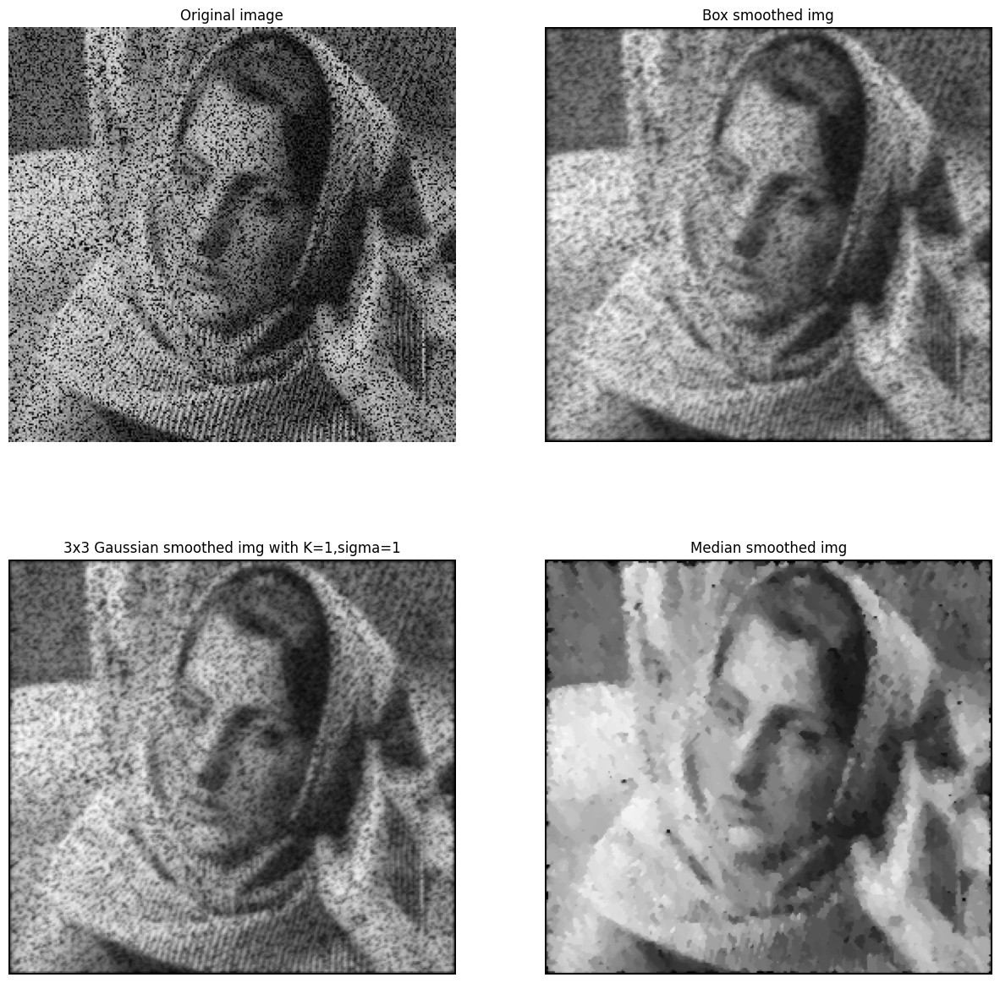

In [348]:
Smoothing()

### SHARPENING (HIGH PASS FILTER)
**SMOOTHING** blurs an image by replacing every pixel intensity with some average intensity of all the ngb pixels. As opposed to it **SHARPENING** (aka **HIGH PASS FILTER**) emphasises regions of sharp intensity changes & darkens other regions. Regions of sharp intensity changes includes noise,edges etc.  

The second-order derivative that computes f(x+1)+f(x-1)-2f(x) in case of 1D image detects edges better requiring less computation as well. In case of 2D images where f(x,y) we have f(x+1,y)+f(x-1,y)-2f(x,y) along the rows & f(x,y+1)+f(x,y-1)-2f(x,y) across the columns. When combined these gives rise to what is known as the **LAPLACIAN KERNEL**.  

If one considers the diagonal entries which are f(x+1,y+1)+f(x-1,y-1)-2f(x,y) & f(x+1,y-1)+f(x-1,y+1)-2f(x,y) respectively they add to the other 2 such equations for x & y coordinates to give a **COMPLETE LAPLACIAN KERNEL**.

#### DEALING WITH NEGATIVE INTENSITIES
While computing pixel intensity changes via **Laplacian kernel** some may have negative values. Since negative values don't mean anything since pixel intensities in an image ranges [0,255] there exists several methods to deal with it such as,  

1. SHIFT & NORMALISE - Here all pixel intensities are shifted by some constant such that they all lie within [0,255]
2. CLIPPING - Here all intensities < 0 are clipped to 0.
3. CONSIDERING ABSOLUTE VALUES - This preserves edge strength at the cost of directional information which dictates transition from light-to-dark & vice-versa.

In [748]:
def Sharpening_Convolution(img,rows,cols):
    #zero pad image
    padded_img=np.zeros((rows+2,cols+2))
    padded_img=Filling_PaddedImage(padded_img,img,rows,cols)
    # padded_img=np.pad(img,((1,1),),mode='reflect')
    
    #set 3x3 complete & regular laplacian kernel
    complete_laplacian_kernel=np.asarray([[1,1,1],
                                 [1,-8,1],
                                 [1,1,1]])
    laplacian_kernel=np.asarray([[0,1,0],
                                 [1,-4,1],
                                 [0,1,0]])
    
    complete_sharpened_img=np.copy(img)
    regular_sharpened_img=np.copy(img)

    for r in tqdm(range(rows)):
        for c in range(cols):
            c_val=complete_laplacian_kernel[0,0]*padded_img[r,c]+complete_laplacian_kernel[0,1]*padded_img[r,c+1]+complete_laplacian_kernel[0,2]*padded_img[r,c+2]+complete_laplacian_kernel[1,0]*padded_img[r+1,c]+complete_laplacian_kernel[1,1]*padded_img[r+1,c+1]+complete_laplacian_kernel[1,2]*padded_img[r+1,c+2]+complete_laplacian_kernel[2,0]*padded_img[r+2,c]+complete_laplacian_kernel[2,1]*padded_img[r+2,c+1]+complete_laplacian_kernel[2,2]*padded_img[r+2,c+2]
            r_val=laplacian_kernel[0,0]*padded_img[r,c]+laplacian_kernel[0,1]*padded_img[r,c+1]+laplacian_kernel[0,2]*padded_img[r,c+2]+laplacian_kernel[1,0]*padded_img[r+1,c]+laplacian_kernel[1,1]*padded_img[r+1,c+1]+laplacian_kernel[1,2]*padded_img[r+1,c+2]+laplacian_kernel[2,0]*padded_img[r+2,c]+laplacian_kernel[2,1]*padded_img[r+2,c+1]+laplacian_kernel[2,2]*padded_img[r+2,c+2]

            #Since negative centre kernel used values are flipped in sign to reflect the actual high intensity transition 
            c_val*=-1
            r_val*=-1

            #clipping to [0,255]
            if c_val<0:
                c_val=0
            elif c_val>255:
                c_val=255
    
            if r_val<0:
                r_val=0
            elif r_val>255:
                r_val=255
            
            complete_sharpened_img[r,c]=c_val
            regular_sharpened_img[r,c]=r_val
    
    return (complete_sharpened_img,regular_sharpened_img)


In [751]:
def Sharpening():
    img_list=glob.glob(pathname="Images/*.*",recursive=True)
    choice=random.randint(0,len(img_list)-1)

    #img path chosen and corresponding img considered
    img=Image.open(img_list[choice])

    #convert img to numpy and convert in case of RGB image to grayscale
    img=np.asarray(img)
    
    try:
        rows,cols,channel=img.shape
    except:
        channel=0
        rows,cols=img.shape
    
    if channel>3:
        img=img[:,:,:3]
        channel=3
    
    if channel==3:
        img_r,img_g,img_b=img[:,:,0],img[:,:,1],img[:,:,2]
        img=0.2989*img_r+0.5870*img_g+0.1140*img_b
    
    completely_sharpened_edgemap,regular_sharpened_edgemap=Sharpening_Convolution(img,rows,cols)

    orig_img_completely_sharpened=img+completely_sharpened_edgemap

    #plot original,regular sharpened & complete sharpened images
    fig,axes=plt.subplots(2,2,figsize=(15,15))

    axes[0,0].imshow(img,cmap='gray')
    axes[0,0].set_title('Original image')
    axes[0,0].axis('off')

    axes[0,1].imshow(regular_sharpened_edgemap,cmap='gray')
    axes[0,1].set_title('Regular sharpened edge map image')
    axes[0,1].axis('off')

    axes[1,0].imshow(completely_sharpened_edgemap,cmap='gray')
    axes[1,0].set_title('Completely sharpened edge map image')
    axes[1,0].axis('off')

    axes[1,1].imshow(orig_img_completely_sharpened,cmap='gray')
    axes[1,1].set_title('Original image sharpened')
    axes[1,1].axis('off')
    
    plt.show()

100%|██████████| 640/640 [00:01<00:00, 454.67it/s]


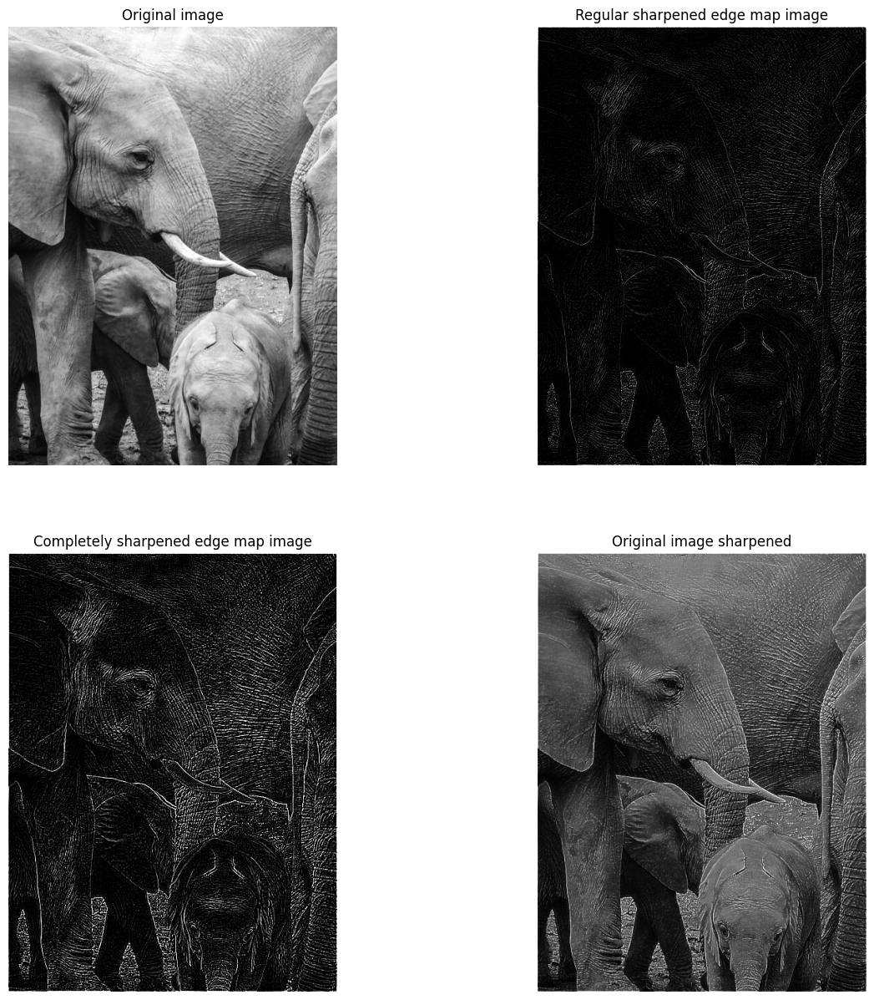

In [764]:
Sharpening()

## UNSHARP MASKING AND HIGH-BOOST FILTERING
Here an image is sharpened by subtrating a smoothed version of image from the original.  

Let f & f' be the original & smoothed version of an image. Image f' is obtained by using a large Gaussian kernel. Then the sharpened image f" is,  
f" = f - kf', where k -> a constant  

In case of unsharp masking, k=1. k above influences sharpening of regions with large intensity transitions such as one obtained at intensity ramps & steps.

In [494]:
def Unsharp_Mask(img,rows,cols):
    #create a reflect-padded img of original & the final unsharp img
    padded_img=np.pad(img,((1,1),),'reflect')
    unsharp_img=padded_img

    #set up gaussian filter of size 3x3
    gaussian_kernel=np.asarray([[0.3679,0.6065,0.3679],[0.6065,1.0000,0.6065],[0.3679,0.6065,0.3679]])*(1/4.8976)

    #convolve image with Gaussian kernel
    for r in tqdm(range(1,rows+1)):
        for c in range(1,cols+1):
            unsharp_img[r,c]=padded_img[r-1,c-1]*gaussian_kernel[0,0]+padded_img[r-1,c]*gaussian_kernel[0,1]+padded_img[r-1,c+1]*gaussian_kernel[0,2]+padded_img[r,c-1]*gaussian_kernel[1,0]+padded_img[r,c]*gaussian_kernel[1,1]+padded_img[r,c+1]*gaussian_kernel[1,2]+padded_img[r+1,c-1]*gaussian_kernel[2,0]+padded_img[r+1,c]*gaussian_kernel[2,1]+padded_img[r+1,c+1]*gaussian_kernel[2,2]
            
    return unsharp_img

In [529]:
def Sharpen_img_via_unsharpmasks(k=1):
    img_list=glob.glob(pathname="Images/*.*",recursive=True)
    choice=random.randint(0,len(img_list)-1)

    #pick a random image & open in PIL form
    img=Image.open(img_list[choice])

    #convert img to numpy ndarray
    img=np.asarray(img)

    try:
        rows,cols,channels=img.shape
    except:
        channels=0
        rows,cols=img.shape
    
    if channels>3:
        img=img[:,:,:3]
        channels=3
    
    if channels==3:
        img_r,img_g,img_b=img[:,:,0],img[:,:,1],img[:,:,2]
        img=0.2989*img_r+0.5870*img_g+0.1140*img_b
    
    #create unsharp image
    unsharped_img=Unsharp_Mask(img,rows,cols)

    #For edge-maps basis k-values, clip negative intensities to zero
    edge_map_img=img-k*unsharped_img[1:rows+1,1:cols+1]
    np.clip(edge_map_img,0,255)
    

    #plot images
    fig,axes=plt.subplots(1,2,figsize=(15,15))

    axes[0].imshow(img,cmap='gray')
    axes[0].set_title('Original image')
    axes[0].axis('off')

    axes[1].imshow(edge_map_img,cmap='gray')
    axes[1].set_title('Edged-map image')
    axes[1].axis('off')

    plt.show()

100%|██████████| 1120/1120 [00:02<00:00, 385.30it/s]


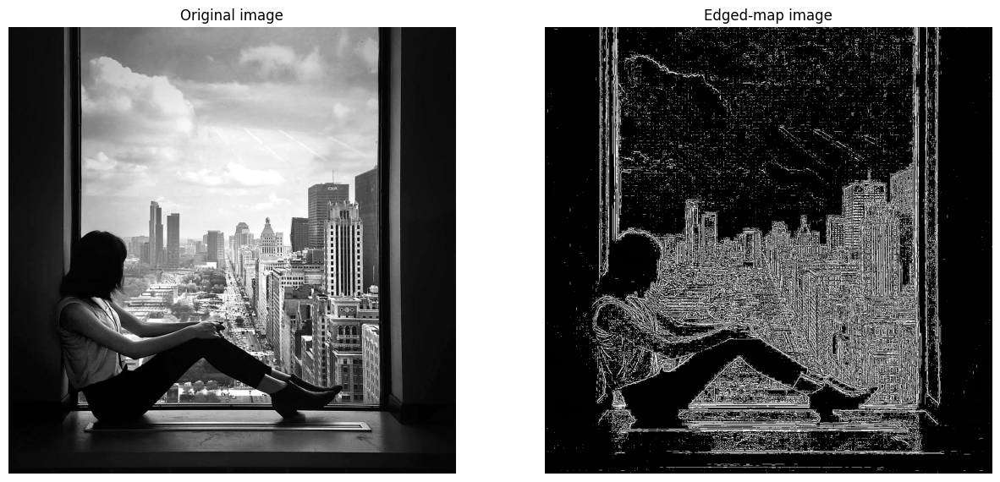

In [533]:
#unsharp masking with k=1 & high-boost filtering with k>1
Sharpen_img_via_unsharpmasks()

## GRADIENT OF IMAGE 
The first order derivative of an image f at (x,y) give by gx and gy can be used to find edge maps. Since the gradient of a vector points to the direction of the greatest rate of change it at the location the gradient of image at every pixel location outputs an edge map.

In [581]:
import math

In [743]:
def First_order_gradient_sharpened_image(img,rows,cols):
    #pad image
    padded_img=np.pad(img,((1,1),),'reflect')

    #set Sobel kernel.
    sobel_kernel_x=np.asarray([[-1,-2,-1],
                             [0,0,0],
                             [1,2,1]])
    sobel_kernel_y=np.asarray([[-1,0,1],
                               [-2,0,2],
                               [-1,0,1]])
    #output image
    M=np.copy(img)

    #compute x & y-gradient and form Gradient img
    for r in tqdm(range(rows)):
        for c in range(cols):
            # gx=padded_img[r-1,c-1]*sobel_kernel_x[0,0]+padded_img[r-1,c]*sobel_kernel_x[0,1]+padded_img[r-1,c+1]*sobel_kernel_x[0,2]+padded_img[r,c-1]*sobel_kernel_x[1,0]+padded_img[r,c]*sobel_kernel_x[1,1]+padded_img[r,c+1]*sobel_kernel_x[1,2]+padded_img[r+1,c-1]*sobel_kernel_x[2,0]+padded_img[r+1,c]*sobel_kernel_x[2,1]+padded_img[r+1,c+1]*sobel_kernel_x[2,2]  
            # gy=padded_img[r-1,c-1]*sobel_kernel_y[0,0]+padded_img[r-1,c]*sobel_kernel_y[0,1]+padded_img[r-1,c+1]*sobel_kernel_y[0,2]+padded_img[r,c-1]*sobel_kernel_y[1,0]+padded_img[r,c]*sobel_kernel_y[1,1]+padded_img[r,c+1]*sobel_kernel_y[1,2]+padded_img[r+1,c-1]*sobel_kernel_y[2,0]+padded_img[r+1,c]*sobel_kernel_y[2,1]+padded_img[r+1,c+1]*sobel_kernel_y[2,2]
            gx = np.sum(padded_img[r:r+3,c:c+3]*sobel_kernel_x)
            gy = np.sum(padded_img[r:r+3,c:c+3]*sobel_kernel_y)

            M[r,c]=min(255,math.sqrt(gx**2+gy**2))
    return M

In [740]:
def Sharpen_Image_Sobel():
    img_list=glob.glob(pathname="Images/*.*",recursive=True)
    choice=random.randint(0,len(img_list)-1)

    #pick a random image & open in PIL form
    img=Image.open(img_list[choice])

    #convert img to numpy ndarray
    img=np.asarray(img)

    try:
        rows,cols,channels=img.shape
    except:
        channels=0
        rows,cols=img.shape
    
    if channels>3:
        img=img[:,:,:3]
        channels=3
    
    if channels==3:
        img_r,img_g,img_b=img[:,:,0],img[:,:,1],img[:,:,2]
        img=0.2989*img_r+0.5870*img_g+0.1140*img_b
    
    M=First_order_gradient_sharpened_image(img,rows,cols)

    #plot
    fig,axes=plt.subplots(1,2,figsize=(15,15))

    axes[0].imshow(img,cmap='gray')
    axes[0].set_title('Original image')
    axes[0].axis('off')

    axes[1].imshow(M,cmap='gray')
    axes[1].set_title('Gradient Image')
    axes[1].axis('off')

    plt.show()

100%|██████████| 640/640 [00:01<00:00, 398.97it/s]


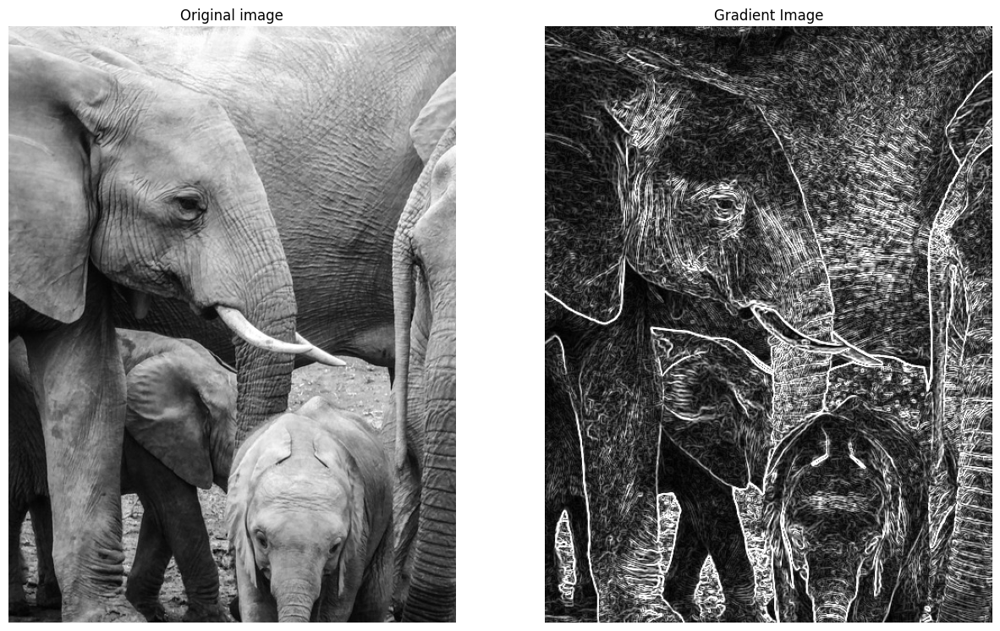

In [744]:
Sharpen_Image_Sobel()

#### MARR-HILDRETH EDGE DETECTION
In all the previous cases images were convolved with either the first or second order derivative filters to find the edges without considering image noise present. 

**MARR-HILDRETH** method is based on the following points: 
1. Intensity changes in images are not independent of image scale
2. Peaks/troughs and zero-crossings in case of first and second order derivative filters are used to detect edges. 
3. Noise affects considerable the performance of both first & second order filters towards edge detection.

Here LOG(**Laplacian Of Gaussian**) operator is used for edge-detection due to the following reasons,
1. **Gaussian** over other smoothing ooperator is used since it is **linear**, performs **uniform smoothing**, **preserves edges** & is **isotropic** (i.e. invariant to image rotation) 
2. **Laplacian** used here results in **zero-crossings** that are considered as edge pixels that connects to form edges in an image. **Laplacian** also is isotropic & linear in nature. Also **zero-crossing** used as edges forms thin edges over first order derivatives that form thick edges.Moreover first-order derivatives are not isotropic in nature.

In [768]:
def Sharpen_Image_Marr_Hildreth(img,rows,cols):
    padded_img=np.pad(img,((2,2),),mode='reflect')
    res_img=np.copy(img)

    #set 3x3 Gaussian & Laplacian kernels
    # Gaussian_kernel = np.asarray([[0.3679,0.6065,0.3679],[0.6065,1.0000,0.6065],[0.3679,0.6065,0.3679]])*(1/4.8976)
    # Complete_Laplacian_kernel = np.asarray([[-1,-1,-1],
    #                                [-1,8,-1],
    #                                [-1,-1,-1]])
    LOG_kernel=np.asarray([[0,0,1,0,0],
                           [0,1,2,1,0],
                           [1,2,-16,2,1],
                           [0,1,2,1,0],
                           [0,0,1,0,0]])
    
    #Perform LOG(Laplacian Of Gaussian) at every pixel
    for r in tqdm(range(rows)):
        for c in range(cols):
            #Smooth image at every pixel & apply laplacian thereafter
            res_img[r,c]=np.sum(padded_img[r:r+5,c:c+5]*LOG_kernel)
    
    return res_img

In [846]:
def Highlight_edges(edge_detected_img,cutoff):
    rows,cols = edge_detected_img.shape
    padded_img = np.pad(edge_detected_img,((1,1),),mode='reflect')
    edge_highlighted_img_wo_threshold = np.zeros((rows,cols))
    edge_detected_img_with_threshold = np.zeros((rows,cols))
    threshold = cutoff*np.max(edge_detected_img)

    #check for zero-crossing & highlight edge-pixels
    for r in tqdm(range(rows)):
        for c in range(cols):
            img = padded_img[r:r+3,c:c+3]
            #check along diag direction
            if (img[0,0]>0 and img[2,2]<0) or (img[0,0]<0 and img[2,2]>0) or (img[2,0]>0 and img[0,2]<0) or (img[2,0]<0 and img[0,2]>0):
                edge_highlighted_img_wo_threshold[r,c] = 255
                if abs(img[0,0]-img[2,2])>=threshold or abs(img[2,0]-img[0,2])>=threshold:
                    edge_detected_img_with_threshold[r,c] = 255
            elif (img[1,0]>0 and img[1,2]<0) or (img[1,0]<0 and img[1,2]>0) or (img[0,1]>0 and img[2,1]<0) or (img[0,1]<0 and img[2,1]>0):
                edge_highlighted_img_wo_threshold[r,c] = 255
                if abs(img[1,0]-img[1,2])>=threshold or abs(img[0,1]-img[2,1])>=threshold:
                    edge_detected_img_with_threshold[r,c] = 255

    return edge_highlighted_img_wo_threshold,edge_detected_img_with_threshold

In [974]:
def Edge_detection_with_MarrHildreth():
    img_list=glob.glob(pathname='Images/*.*',recursive=True)
    choice=random.randint(0,len(img_list)-1)

    #open img in PIL & convert to numpy
    img=Image.open("Images/human.jpg")
    img=np.asarray(img)

    try:
        rows,cols,channels=img.shape
    except:
        rows,cols=img.shape
        channels=1

    if channels==2:
        img=img[:,:,:2]
        img_r,img_g=img[:,:,0],img[:,:,1]
        img=0.2989*img_r+0.5870*img_g
        
    if channels>3:
        img=img[:,:,:3]
        channels=3
        
    if channels==3:
        img_r,img_g,img_b=img[:,:,0],img[:,:,1],img[:,:,2]
        img=0.2989*img_r+0.5870*img_g+0.1140*img_b
    
    edge_detected_img = Sharpen_Image_Marr_Hildreth(img,rows,cols)

    #highlight the edges by finding the zero-crossing with a threshold of 0 using a 3x3 region
    cutoff = int(input("Enter cutoff value to find zero-crossing and hence edges as percentage"))
    edge_highlighted_img_wo_threshold,edge_highlighted_img_with_threshold = Highlight_edges(edge_detected_img,cutoff/100)

    #plot original & edge detected images
    fig,axes=plt.subplots(2,2,figsize=(15,15))

    axes[0,0].imshow(img,cmap='gray')
    axes[0,0].set_title('Original image')
    axes[0,0].axis('off')

    axes[0,1].imshow(edge_detected_img,cmap='gray')
    axes[0,1].set_title('Marr-Hildreth edge map image')
    axes[0,1].axis('off')

    axes[1,0].imshow(edge_highlighted_img_wo_threshold,cmap='gray')
    axes[1,0].set_title('Marr-Hildreth edge highlighted image')
    axes[1,0].axis('off')

    axes[1,1].imshow(edge_highlighted_img_with_threshold,cmap='gray')
    axes[1,1].set_title('Marr-Hildreth edge highlighted image with cutoff at {}%'.format(cutoff))
    axes[1,1].axis('off')

    plt.show()

100%|██████████| 5184/5184 [00:17<00:00, 303.78it/s]


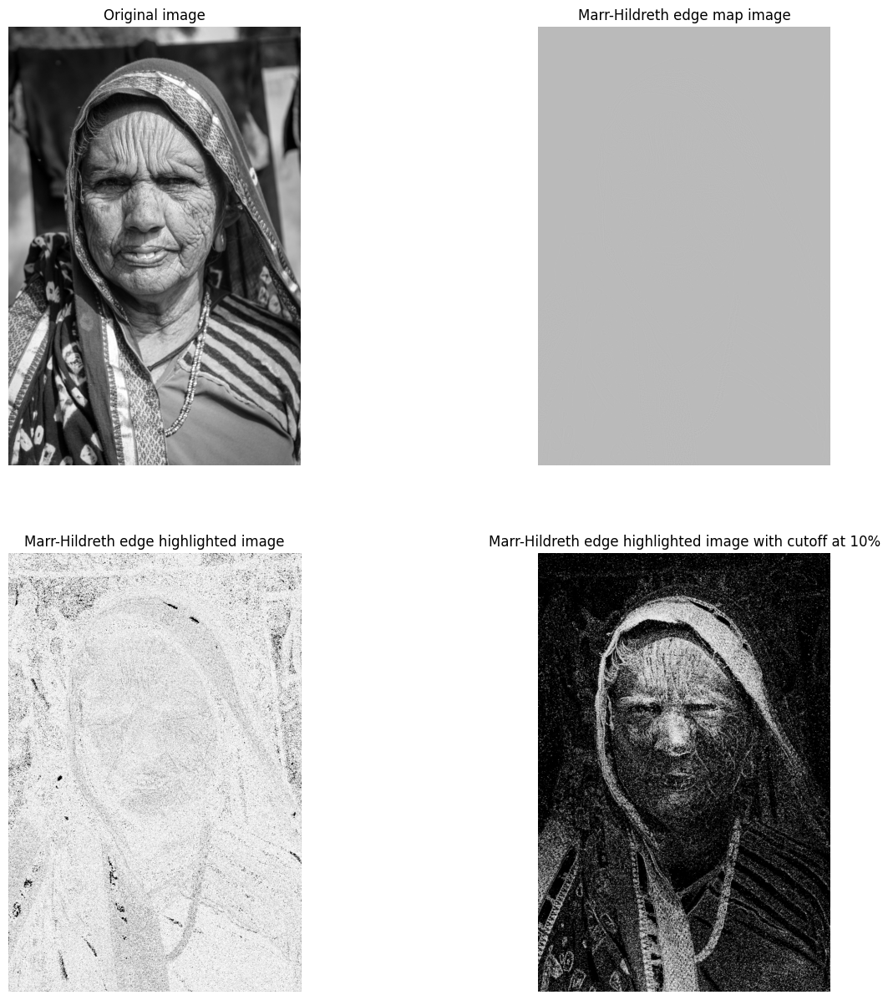

In [977]:
Edge_detection_with_MarrHildreth()

#### CANNY EDGE DETECTOR
Based on first order derivative usually **SOBEL** kernel it outputs thin,well-localised edges contrary to **Marr-Hildreth** that is based on second-order Laplacian kernel.
Both uses **Gaussian** kernel to smooth images. While **Canny** uses **Non-Maxima Suppression** - a technique used to thin edges , **Marr-Hildreth** uses no such technique.

It is usually observed that **Marr-Hildreth** outputs thick edges since using **Gaussian** kernel of large sigma causes numerous adjacent zero-crossing pixels to be present and thus forms thick edges.

In [857]:
def Smooth_Image(padded_img,rows,cols):
    smoothed_img = np.zeros((rows,cols))

    #set 3x3 Gaussian kernel
    Gaussian_kernel=np.asarray([[0.3679,0.6065,0.3679],[0.6065,1.0000,0.6065],[0.3679,0.6065,0.3679]])*(1/4.8976)

    for r in tqdm(range(rows)):
        for c in range(cols):
            smoothed_img[r,c] = np.sum(padded_img[r:r+3,c:c+3]*Gaussian_kernel)
    
    return smoothed_img

In [909]:
def Gradient_Image(smoothed_img,rows,cols):
    padded_smoothed_img = np.pad(smoothed_img,((1,1),),mode='reflect')

    #set Prewit Kernels
    Prewit_x = np.array([[-1,-2,-1],
                         [0,0,0],
                         [1,2,1]])
    Prewit_y = np.array([[-1,0,1],
                         [-2,0,2],
                         [-1,0,1]])
    #set gradient magnitude & angle images with the latter having values in radians
    M = np.zeros((rows,cols))
    A = np.zeros((rows,cols))

    #compute Gradient Magnitude & Angle images
    for r in tqdm(range(rows)):
        for c in range(cols):
            Gx = np.sum(padded_smoothed_img[r:r+3,c:c+3]*Prewit_x)
            Gy = np.sum(padded_smoothed_img[r:r+3,c:c+3]*Prewit_y)

            M[r,c] = min(255,math.sqrt(Gx**2+Gy**2))

            if Gx==0:
                if Gy>0:
                    A[r,c] = math.pi/2
                elif Gy<0:
                    A[r,c] = -1*(math.pi/2)
            else:
                A[r,c] = math.atan(Gy/Gx)
    
    return M,A

In [910]:
def Non_Maxima_Suppression(grad_img,grad_angle_img,rows,cols):
    padded_grad_img = np.pad(grad_img,((1,1),),mode='reflect')

    #set output non-max suppressed img
    non_maxima_suppressed_img = np.zeros((rows,cols))

    #rad to deg conversion
    rad_to_deg = 180/math.pi

    #set edge directions in degrees
    edge_horiz = [[-22.5,22.5],[157.5,-157.5]]
    edge_vert = [[-67.5,-112.5],[67.5,112.5]]
    edge_negfortyfive = [[22.5,67.5],[-112.5,-157.5]]
    edge_posfortyfive = [[-22.5,-67.5],[112.5,157.5]]

    #perform non-maxima suppression
    for r in tqdm(range(rows)):
        for c in range(cols):
            img = padded_grad_img[r:r+3,c:c+3]
            
            #check for vertical edge
            if (grad_angle_img[r,c]*rad_to_deg>=edge_vert[0][1] and grad_angle_img[r,c]*rad_to_deg<edge_vert[0][0]) or (grad_angle_img[r,c]*rad_to_deg>=edge_vert[1][0] and grad_angle_img[r,c]*rad_to_deg<edge_vert[1][1]):
                if img[1,1] > max(img[0,1],img[2,1]):
                    non_maxima_suppressed_img[r,c] = img[1,1]

            #check for diagonal edges
            elif (grad_angle_img[r,c]*rad_to_deg>=edge_negfortyfive[0][0] and grad_angle_img[r,c]*rad_to_deg<edge_negfortyfive[0][1]) or (grad_angle_img[r,c]*rad_to_deg<edge_negfortyfive[1][0] and grad_angle_img[r,c]*rad_to_deg>=edge_negfortyfive[1][1]):
                if img[1,1] > max(img[0,0],img[2,2]):
                    non_maxima_suppressed_img[r,c] = img[1,1]

            elif (grad_angle_img[r,c]*rad_to_deg>=edge_posfortyfive[0][1] and grad_angle_img[r,c]*rad_to_deg<edge_posfortyfive[0][0]) or (grad_angle_img[r,c]*rad_to_deg>=edge_posfortyfive[1][0] and grad_angle_img[r,c]*rad_to_deg<edge_posfortyfive[1][1]):
                if img[1,1] > max(img[0,2],img[2,0]):
                    non_maxima_suppressed_img[r,c] = img[1,1]

            #check for horizontal edge
            elif (grad_angle_img[r,c]*rad_to_deg>=edge_horiz[0][0] and grad_angle_img[r,c]*rad_to_deg<edge_posfortyfive[0][1]) or (grad_angle_img[r,c]*rad_to_deg>=edge_posfortyfive[1][0] and grad_angle_img[r,c]*rad_to_deg<edge_posfortyfive[1][1]):
                if img[1,1] > max(img[1,0],img[1,2]):
                    non_maxima_suppressed_img[r,c] = img[1,1]
    
    return non_maxima_suppressed_img

In [978]:
def Thresholding_and_Hysterysis(non_max_supp_img,T_low=0.00005,T_high=0.0001):
    '''
    This function highlights true edge pixels from false ones such that the final edged image has continuous edges in it. It uses double thresholding
    such that one captures all true edge pixels bound to be present while the other has both true & false ones. Next basis 8-connectivity of strong-edge pixels to be present it connects
    the weak-edge pixels so final img has continuous long edges and no broken ones.
    '''
    #strong edge img contains true edge pixels that are guranteed to be part of the edged img
    strong_edge_img = np.where(non_max_supp_img>=T_high,non_max_supp_img,0)

    #weak edge img contains both false & true edge pixels
    weak_edge_img = np.where(non_max_supp_img>=T_low,non_max_supp_img,0)

    rows,cols = non_max_supp_img.shape

    #keep only weak edge pixels in weak_edge_img
    weak_edge_img = weak_edge_img - strong_edge_img

    valid_edges = []
    #link weak & strong edges with 8-connectivity
    for r in tqdm(range(rows)):
        for c in range(cols):
            if strong_edge_img[r,c]>0:
                if (r-1>=0 and r-1<rows) and (c-1>=0 and c-1<cols) and weak_edge_img[r-1,c-1]>0 and [r-1,c-1] not in valid_edges:
                    valid_edges.append([r-1,c-1])
                if (r-1>=0 and r-1<rows) and (c>=0 and c<cols) and weak_edge_img[r-1,c]>0 and [r-1,c] not in valid_edges:
                    valid_edges.append([r-1,c])
                if (r-1>=0 and r-1<rows) and (c+1>=0 and c+1<cols) and weak_edge_img[r-1,c+1]>0 and [r-1,c+1] not in valid_edges:
                    valid_edges.append([r-1,c+1])
                if (r>=0 and r<rows) and (c-1>=0 and c-1<cols) and weak_edge_img[r,c-1]>0 and [r,c-1] not in valid_edges:
                    valid_edges.append([r,c-1])
                if (r>=0 and r<rows) and (c+1>=0 and c+1<cols) and weak_edge_img[r,c+1]>0 and [r,c+1] not in valid_edges:
                    valid_edges.append([r,c+1])
                if (r+1>=0 and r+1<rows) and (c-1>=0 and c-1<cols) and weak_edge_img[r+1,c-1]>0 and [r+1,c-1] not in valid_edges:
                    valid_edges.append([r+1,c-1])
                if (r+1>=0 and r+1<rows) and (c>=0 and c<cols) and weak_edge_img[r+1,c]>0 and [r+1,c] not in valid_edges:
                    valid_edges.append([r+1,c])
                if (r+1>=0 and r+1<rows) and (c+1>=0 and c+1<cols) and weak_edge_img[r+1,c+1]>0 and [r+1,c+1] not in valid_edges:
                    valid_edges.append([r+1,c+1])
    
    #mark all pixels in weak_edge_img not visited as 0 since they don't resemble valid edge pixels 
    for r in tqdm(range(rows)):
        for c in range(cols):
            if [r,c] not in valid_edges and weak_edge_img[r,c]>0:
                weak_edge_img[r,c]=0
    
    #The remaining pixels in weak_edge_img now corresponds to edge pixels & hence we add them to strong_edge_img
    strong_edge_img = strong_edge_img + weak_edge_img

    return strong_edge_img

In [1120]:
def Find_Canny_Edged_Image(img,rows,cols):
    padded_img = np.pad(img,((1,1),),mode='reflect')
    
    #Apply Gaussian smoothing
    smoothed_img = Smooth_Image(padded_img,rows,cols)

    #Find Gradient Magnitude & Gradient angle images
    gradient_img,gradient_angle_img = Gradient_Image(smoothed_img,rows,cols)

    #Non-maxima Suppression
    Non_max_suppressed_img = Non_Maxima_Suppression(gradient_img,gradient_angle_img,rows,cols)

    #Perform Double thresholding & hysterysis edge linking
    canny_edged_map_img = Thresholding_and_Hysterysis(Non_max_suppressed_img)

    return canny_edged_map_img

In [968]:
def Canny_Edge_Detector():
    img_list = glob.glob(pathname="Images/*.*",recursive=True)
    choice = random.randint(0,len(img_list)-1)

    #open image as PIL
    img = Image.open("Images/human.jpg")
    #convert to numpy
    img = np.asarray(img)

    try:
        rows,cols,channels = img.shape
    except:
        rows,cols = img.shape
        channels = 1
    
    if channels==2:
        img=img[:,:,:2]
        img_r,img_g=img[:,:,0],img[:,:,1]
        img=0.2989*img_r+0.5870*img_g
        
    if channels>3:
        img=img[:,:,:3]
        channels=3
        
    if channels==3:
        img_r,img_g,img_b=img[:,:,0],img[:,:,1],img[:,:,2]
        img=0.2989*img_r+0.5870*img_g+0.1140*img_b
    
    canny_edged_img = Find_Canny_Edged_Image(img,rows,cols)

    print(np.max(canny_edged_img),np.min(canny_edged_img))

    #plot images
    fig,axes = plt.subplots(1,2,figsize=(15,15))

    axes[0].imshow(img,cmap='gray')
    axes[0].set_title('Original image')
    axes[0].axis('off')

    axes[1].imshow(canny_edged_img,cmap='gray')
    axes[1].set_title('Canny edged image')
    axes[1].axis('off')

    plt.show()

100%|██████████| 5184/5184 [00:02<00:00, 2544.48it/s]


255.0 0.0


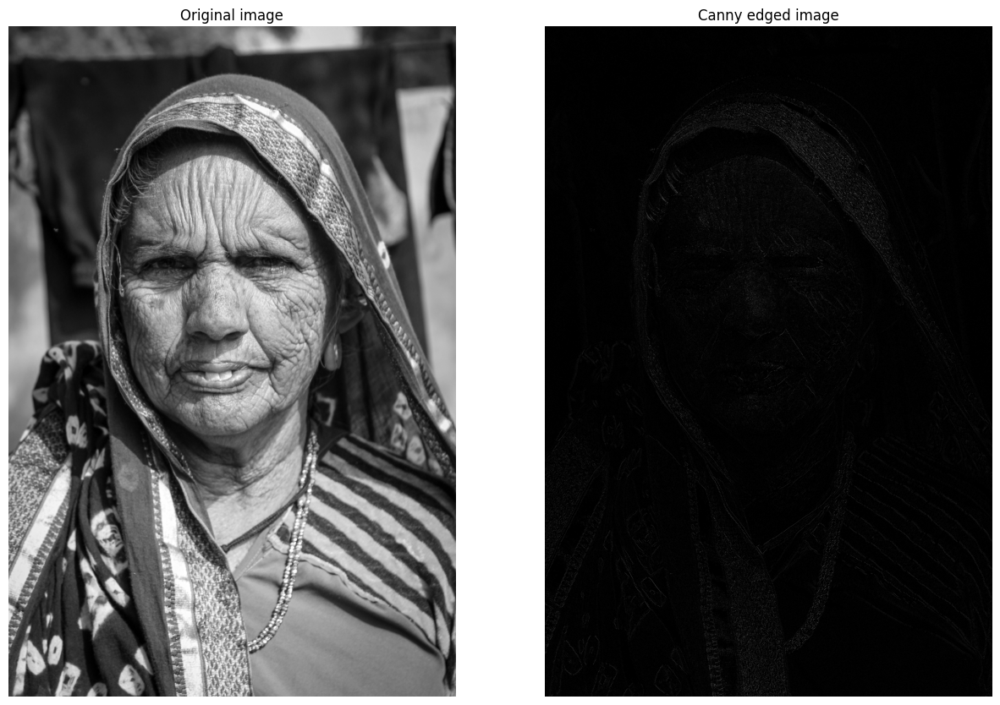

In [979]:
Canny_Edge_Detector()

#### LINKING EDGE VIA LOCAL PROCESSING

Most edge-detection algorithm follows thresholding to identify edge-pixels that form edges. Below **LOCAL PROCESSING** is used to link edges after computation of image gradient & angles using any of **SOBEL,PREWIT** kernels.

In [1107]:
def Local_Edge_Linking(Gradient_img,Angle_img,Specified_angle=90,Grad_thresh=30,Angle_range=45,gap_length=5):
    rows,cols = Gradient_img.shape

    res = np.zeros((rows,cols))

    #rad to deg conversion
    rad_to_deg = 180/math.pi

    #set thresholds
    Tm = np.max(Gradient_img)*(Grad_thresh/100)
    L = round(cols*(gap_length/100))
    angle_low = Specified_angle-Angle_range
    angle_high = Specified_angle+Angle_range

    #mark edge-pixels
    for r in tqdm(range(rows)):
        for c in range(cols): 
            if Gradient_img[r,c]>Tm and (Angle_img[r,c]*rad_to_deg>=angle_low and Angle_img[r,c]*rad_to_deg<=angle_high):
                res[r,c] = 1
    
    #Fill gaps
    for r in tqdm(range(rows)):
        left = -1
        right = -1
        for c in range(cols):
            if left==-1 and c<cols-1 and res[r,c]==1 and res[r,c+1]==0:
                left = c+1
            if left!=-1 and c<cols-1 and res[r,c]==0 and res[r,c+1]==1:
                right = c
            if left!=-1 and right!=-1:
                if right-left+1<=L:
                    for i in range(left,right+1):
                        res[r,i] = 1
                left = -1
                right = -1
    
    return res

In [1093]:
def Complete_edge_link_image(local_edge_img_vert,local_edge_img_horiz):
    rows,cols = local_edge_img_horiz.shape

    output_img = np.zeros((rows,cols))

    #perform logical OR
    for r in tqdm(range(rows)):
        for c in range(cols):
            if local_edge_img_horiz[r,c]==1 or local_edge_img_vert[r,c]==1:
                output_img[r,c]=1
    
    return output_img

In [1103]:
def Linking_Edge_Via_Local_Processing():
    img_list = glob.glob(pathname="Images/*.*",recursive=True)
    choice = random.randint(0,len(img_list)-1)

    #open image as PIL
    img = Image.open("Images/vehicle_rear_7.jpg")
    #convert to numpy
    img = np.asarray(img)

    try:
        rows,cols,channels = img.shape
    except:
        rows,cols = img.shape
        channels = 1
    
    if channels==2:
        img=img[:,:,:2]
        img_r,img_g=img[:,:,0],img[:,:,1]
        img=0.2989*img_r+0.5870*img_g
        
    if channels>3:
        img=img[:,:,:3]
        channels=3
        
    if channels==3:
        img_r,img_g,img_b=img[:,:,0],img[:,:,1],img[:,:,2]
        img=0.2989*img_r+0.5870*img_g+0.1140*img_b
    
    #pad image
    padded_img = np.pad(img,((1,1),),mode='reflect')

    #smooth img in case it is noisy
    # smoothed_img = Smooth_Image(padded_img,rows,cols)

    #Find Gradient Magnitude & Gradient angle images
    gradient_img,gradient_angle_img = Gradient_Image(img,rows,cols)

    #Local edge linking vertically and horizontally
    local_edged_link_img_vert = Local_Edge_Linking(gradient_img,gradient_angle_img)
    local_edged_link_img_horiz= Local_Edge_Linking(gradient_img,gradient_angle_img,Specified_angle=0)

    #complete edge link image
    local_edged_link_img_complete = Complete_edge_link_image(local_edged_link_img_horiz,local_edged_link_img_vert)

    #plot img
    fig,axes = plt.subplots(3,2,figsize=(15,15))

    axes[0,0].imshow(img,cmap='gray')
    axes[0,0].set_title("Original image")
    axes[0,0].axis('off')

    axes[0,1].imshow(gradient_img,cmap='gray')
    axes[0,1].set_title("Gradient image")
    axes[0,1].axis('off')

    axes[1,0].imshow(local_edged_link_img_vert,cmap='gray')
    axes[1,0].set_title("Vertical Edge-link image")
    axes[1,0].axis('off')

    axes[1,1].imshow(local_edged_link_img_horiz,cmap='gray')
    axes[1,1].set_title("Horizontal Edge-link image")
    axes[1,1].axis('off')

    axes[2,0].imshow(local_edged_link_img_complete,cmap='gray')
    axes[2,0].set_title("Complete Edge-link image")
    axes[2,0].axis('off')

    plt.show()

100%|██████████| 4000/4000 [00:04<00:00, 954.16it/s]


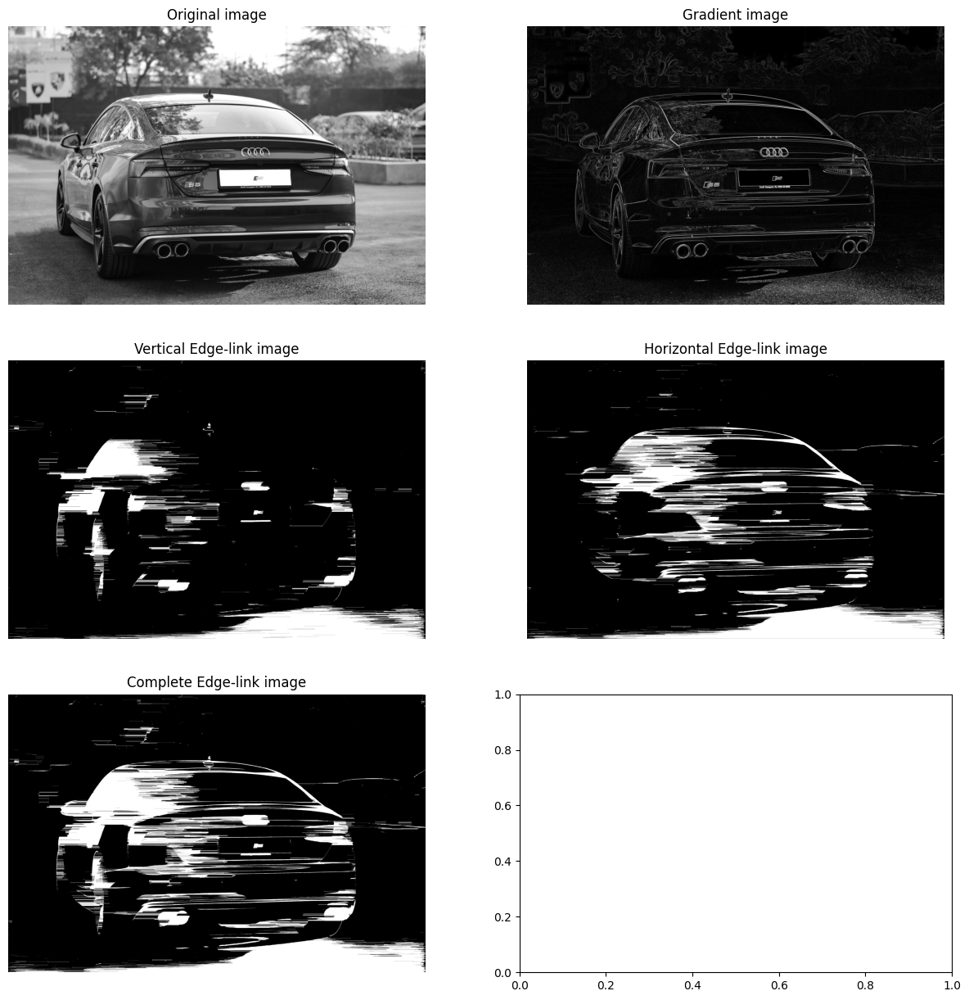

In [1108]:
Linking_Edge_Via_Local_Processing()

#### HOUGH TRANSFORM

In [1177]:
def Link_edges_via_Hough(edge_img):
    '''
    This function sets up the parameter-space for Hough Transform to see how certain pixels in edge-map lie in a straight line
    '''
    rows,cols = edge_img.shape

    #deg to rad conversion
    deg_to_rad = math.pi/180

    #set up parameters viz rho & theta in degrees
    d = math.sqrt(rows*rows+cols*cols)
    theta = list(range(-90,91))

    #find counts of pixels across accumulator cells
    accumulator = {}

    for r in tqdm(range(rows)):
        for c in range(cols):
            if edge_img[r,c]==255:
                for angle in theta:
                    #rho(i) = x(i)*cos(theta) + y(i)*sin(theta)
                    rho_c = round(r*math.cos(angle*deg_to_rad)+c*math.sin(angle*deg_to_rad))
                    if (rho_c,angle) not in accumulator:
                        accumulator[(rho_c,angle)]=[]
                    accumulator[(rho_c,angle)].append([r,c])
    
    #plot accumulator cells counts
    rho_list = [x for (x,y) in accumulator.keys()]
    theta_list = [y for (x,y) in accumulator.keys()]
    count_list = [len(accumulator[k]) for k in accumulator.keys()]
    
    #create plot
    plt.scatter(theta_list,rho_list,count_list,marker='*')
    plt.ylim((-d,d))
    plt.xlim((-90,90))
    plt.xlabel('Theta in degrees')
    plt.ylabel('rho')
    plt.title('Accumulator space for Hough Transform')
    plt.show()

    #examine accumulator cells with max concentration of pixels
    max_pixels = -1
    rho_max=0
    theta_max=0

    for item in accumulator.keys():
        if len(accumulator[item]) > max_pixels:
            max_pixels = len(accumulator[item])
            rho_max,theta_max = item

    return accumulator,rho_max,theta_max

In [1121]:
def Find_Canny_Edged_Image_with_no_smoothing(img,rows,cols):
    #Find Gradient Magnitude & Gradient angle images
    gradient_img,gradient_angle_img = Gradient_Image(img,rows,cols)

    #Non-maxima Suppression
    Non_max_suppressed_img = Non_Maxima_Suppression(gradient_img,gradient_angle_img,rows,cols)

    #Perform Double thresholding & hysterysis edge linking
    canny_edged_map_img = Thresholding_and_Hysterysis(Non_max_suppressed_img)

    return canny_edged_map_img

In [1163]:
def Highlight_points(accumulator,rho_max,theta_max,rows,cols):
    res = np.zeros((rows,cols))

    for point in accumulator[(rho_max,theta_max)]:
        res[point[0],point[1]] = 255

    return res

In [1178]:
def Hough_Transform():
    img_list = glob.glob(pathname="Images/*.*",recursive=True)
    choice = random.randint(0,len(img_list)-1)

    #open image as PIL
    img = Image.open("Images/vehicle_rear_3.jpeg")
    #convert to numpy
    img = np.asarray(img)

    try:
        rows,cols,channels = img.shape
    except:
        rows,cols = img.shape
        channels = 1
    
    if channels==2:
        img=img[:,:,:2]
        img_r,img_g=img[:,:,0],img[:,:,1]
        img=0.2989*img_r+0.5870*img_g
        
    if channels>3:
        img=img[:,:,:3]
        channels=3
        
    if channels==3:
        img_r,img_g,img_b=img[:,:,0],img[:,:,1],img[:,:,2]
        img=0.2989*img_r+0.5870*img_g+0.1140*img_b
    
    canny_edged_img = Find_Canny_Edged_Image_with_no_smoothing(img,rows,cols)
    accumulator,rho_max,theta_max = Link_edges_via_Hough(canny_edged_img)

    # print(rho_max,theta_max,accumulator[(rho_max,theta_max)])
    
    #highlight points that lie at rho_max,theta_max in img_plane
    res = Highlight_points(accumulator,rho_max,theta_max,rows,cols)

    #plot img
    fig,axes = plt.subplots(2,2,figsize=(15,15))

    axes[0,0].imshow(img,cmap='gray')
    axes[0,0].set_title("Original image")
    axes[0,0].axis('off')

    axes[0,1].imshow(canny_edged_img,cmap='gray')
    axes[0,1].set_title("Canny edge map")
    axes[0,1].axis('off')

    axes[1,0].imshow(res,cmap='gray')
    axes[1,0].set_title("Points present in accumulator cell with max pixel concentration")
    axes[1,0].axis('off')

    plt.show()

100%|██████████| 216/216 [00:00<00:00, 6358.57it/s]


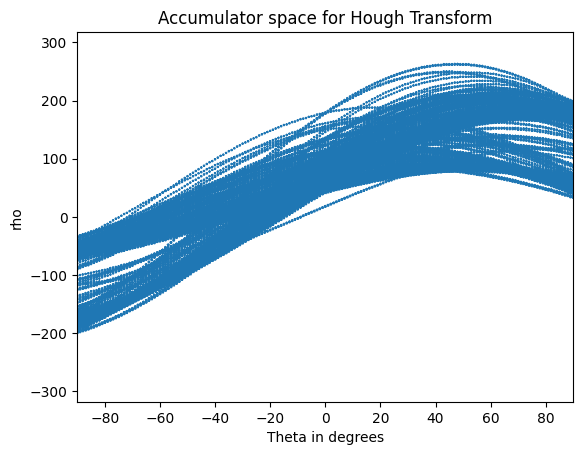

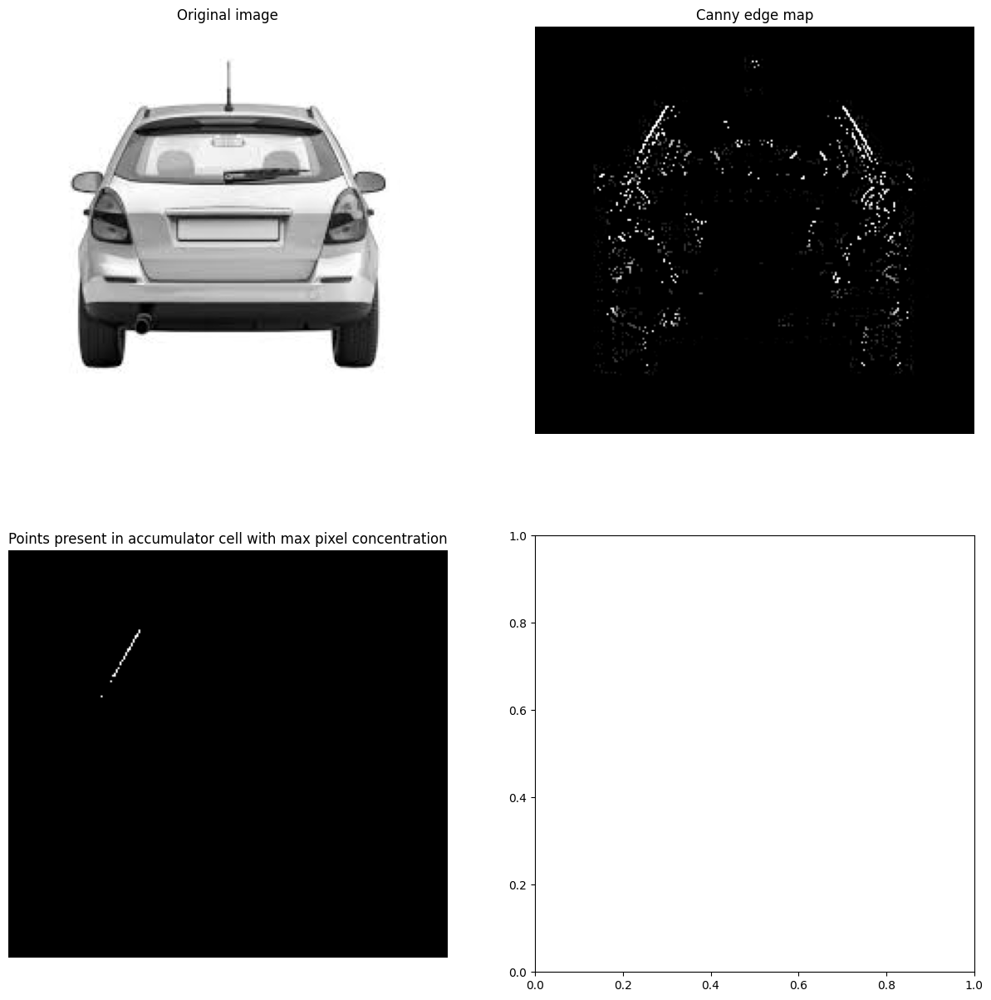

In [1179]:
Hough_Transform()

### IMAGE SEGMENTATION USING INTENSITY THRESHOLDING
Earlier edge-pixels were used to perform image segmentation. It involved finding the edge-pixels followed by linking them to draw boundaries. 

Here pixel inensity is used to segment image into different classes or groups. 2 methods used are,
1. BASIC GLOBAL THRESHOLDING
2. OPTIMUM THRESHOLDING USING OTSU'S METHOD

In both of these methods pdf of pixel intensities are looked at. In **GLOBAL THRESHOLDING** the intensity histogram gives clear indication of the threshold to be used for segmentation while **OTSU'S METHOD** is usually employed in situations where there exists no single intensity that seperates classes (viz. object and background).

In [1284]:
def Segment_Image(img,T):
    '''
    Segment image basis intensity distribution.

    img: Input grayscale image
    T: Intensity threshold to segment image at.
    '''
    thresh_img = np.copy(img)
    rows,cols = img.shape

    for r in tqdm(range(rows)):
        for c in range(cols):
            if img[r,c]<=T:
                thresh_img[r,c]=0
            else:
                thresh_img[r,c]=1
                
    # display thresholded image
    plt.imshow(thresh_img,cmap='gray')
    plt.title(f'Thresholded image with threshold at {T}')
    plt.axis('off')
    plt.show()

In [1253]:
def Normalised_Intensity_Histogram(img,rows,cols):
    '''
    Function to compute normalised intensity histogram of image and display it.
    '''
    #compute normalised intensity histogram of img
    d = {}

    for r in tqdm(range(rows)):
        for c in range(cols):
            if img[r,c] not in d:
                d[img[r,c]]=0
            d[img[r,c]]+=(1/(rows*cols))
    
    intensities_list = list(d.keys())
    pixel_probs = list(d.values())

    #display normalised intensity histogram & corresponding img
    fig,axes = plt.subplots(1,2,figsize=(12,12))

    axes[0].imshow(img,cmap='gray')
    axes[0].set_title('Original image')
    axes[0].axis('off')

    axes[1].bar(x=intensities_list,height=pixel_probs)
    axes[1].set_xlabel('Intensities')
    axes[1].set_ylabel('Pixel probability')
    axes[1].set_title('Normalised Intensity Histogram')
    plt.show()

    return d

In [1225]:
def Segment_And_Compute_Next_Threshold(img,T):
    '''
    function to segment image into background and foreground using current global threshold estimate and compute next global threshold estimate basis average of class-wise mean intensity.
    '''
    rows,cols = img.shape
    # dictionary that stores pixel intensity against its frequency for different classes
    d1 = {}
    d2 = {}

    for r in tqdm(range(rows)):
        for c in range(cols):
            if img[r,c]<=T:
                if img[r,c] not in d1:
                    d1[img[r,c]]=0
                d1[img[r,c]]+=1
            else:
                if img[r,c] not in d2:
                    d2[img[r,c]]=0
                d2[img[r,c]]+=1
    
    # "Avg_intensity_i" stores avg intensity value for ith class
    Avg_intensity_1 = (np.sum([k*val for k,val in d1.items()]))/(rows*cols)
    Avg_intensity_2 = (np.sum([k*val for k,val in d2.items()]))/(rows*cols)
    
    return (Avg_intensity_1+Avg_intensity_2)/2

In [1261]:
def Global_thresholding(img,intensities_list):
    '''
    Function that performs global thresholding of image.
    '''

    #Perform global thresholding
    # Set up an estimate of global threshold
    T_curr = np.average(intensities_list)
    # Set-up stopping criteria for iteration. Compares T(i) & T(i-1) values to find difference, where i -> ith iteration. If difference is T_del iteration ceases.
    T_del = 0

    # 1. Select intial estimate T
    # 2. Segregate pixels into 2 classes depending on T.
    # 3. Compute average intensity values T1 & T2 among 2 classes
    # 4. Compute new threshold mid-way between T1 & T2.
    # 5. Repeat above steps until values of T in successive iterations <= T_del

    while True:
        T_prev = T_curr
        T_curr = Segment_And_Compute_Next_Threshold(img,T_curr)

        if abs(T_curr-T_prev)<=T_del:
            break

    # segment image basis T_curr
    Segment_Image(img,T_curr)


In [1259]:
def Class1_prob_and_mean_intensity_upto_k(k,img):
    '''
    Computes class-1 probability & avg intensity upto level k.

    T: threshold selected
    img: Image
    '''
    rows,cols = img.shape
    class1_prob = 0
    d = {}

    for r in tqdm(range(rows)):
        for c in range(cols):
            if img[r,c]<=k:
                class1_prob+=(1/(rows*cols))
                if img[r,c] not in d:
                    d[img[r,c]]=0
                d[img[r,c]]+=1
    
    Avg_intensity_upto_k = (np.sum([k*val for k,val in d.items()]))/(rows*cols)
    return class1_prob,Avg_intensity_upto_k

In [1298]:
def Otsu_thresholding():
    '''
    Performs optimum image segmentation using image intensity by maximising between class variance that seperates different classes. Here between class variance denotes
    difference between classwise mean intensity and mean intensity.

    k: Level of threshold belonging to (0,L-1)
    m1(k): class1 mean intensity at k
    m2(k): class2 mean intensity at k
    P1(k): Probability of class-1 at k
    P2(k): Probability of class-2 at k
    L: No of grayscale levels
    p(i): probability of pixel with intensity i. p(i)=n(i)/(M*N)
    M,N: dim of image
    n(i): num of pixels with intensity i
    m(G): Mean intesnity of entire image (constant)
    m(k): mean intensity upto level k

    Class1 considers for any k all pixels with intensity range [0,k] & class2 has intensities ranging [k+1,L-1].
    M*N = n(0)+n(1)+...+n(i) is the sum of pixels with varying intensities in image

    Sigma(b)^2 = (m(G)*P1(k)-m(k))^2/P1(k)(1-P1(k)), 
    '''

    img_list = glob.glob(pathname="Images/*.*",recursive=True)
    choice = random.randint(0,len(img_list)-1)

    img = Image.open("Images/Noisy_img_1.png")

    #convert img to numpy ndarray
    img = np.asarray(img)

    #convert img to grayscale
    try:
        rows,cols,channels = img.shape
    except:
        rows,cols = img.shape
        channels = 1
    
    #convert img with 2 channels
    if channels == 2:
        img_r,img_g = img[:,:,0],img[:,:,1]
        img=0.2989*img_r+0.5870*img_g
    
    #convert any img with >= 3 channels to grayscale
    if channels >= 3:
        img_r,img_g,img_b = img[:,:,0],img[:,:,1],img[:,:,2]
        img=0.2989*img_r+0.5870*img_g+0.1140*img_b
    
    # 1. Here for different values of k ,Sigma(b)^2 is computed to check which all values turn out to be maximum.
    # 2. If there does not exist a unique k=k* then we take avg of all such k*.
    i_min = round(np.min(img))
    i_max = round(np.max(img))
    rows,cols = img.shape

    # variable to store max between-class variance
    max_between_class_var = -1

    # List to store threshold levels with between-class variance & threshold levels corresponding to max between class variance resp
    threshold_intensities_with_between_class_variance = {}
    max_between_class_var_thresholds = []

    # map intensity to pixel probability, display original image and its normalised intensity histogram resp.
    Intensity_dist_Of_Pixel_prob = Normalised_Intensity_Histogram(img,rows,cols)

    # compute avg intensity of entire image
    Avg_Intensity_Of_Image = np.sum([intensity*prob for intensity,prob in Intensity_dist_Of_Pixel_prob.items()])
    
    # compute between-class variances for different threshold levels k
    for k in tqdm(range(max(1,i_min),i_max)):
        P1_k,Avg_intensity_upto_k = Class1_prob_and_mean_intensity_upto_k(k,img)

        # compute between class variance at threshold level k
        between_class_var_k = (math.pow(((Avg_Intensity_Of_Image*P1_k)-Avg_intensity_upto_k),2))/(P1_k*(1-P1_k))

        # Store threshold level k corresponding to max between-class variance
        if between_class_var_k>=max_between_class_var:
            max_between_class_var = between_class_var_k

        # populate threshold level k against its between-class variance
        threshold_intensities_with_between_class_variance[k] = between_class_var_k
    
    # Find optimum threshold level k* for which between-class variance is maximum.
    for threshold in threshold_intensities_with_between_class_variance:
        if threshold_intensities_with_between_class_variance[threshold] == max_between_class_var:
            max_between_class_var_thresholds.append(threshold)
    
    k_optimum = np.average(max_between_class_var_thresholds)

    # Segment image and display it.
    Segment_Image(img,k_optimum)

In [1297]:
def Basic_Image_thresholding():
    '''
    Function to perform Global single thresholding of image.
    '''
    img_list = glob.glob(pathname="Images/*.*",recursive=True)
    choice = random.randint(0,len(img_list)-1)

    img = Image.open("Images/Noisy_img_1.png")

    #convert img to numpy ndarray
    img = np.asarray(img)

    #convert img to grayscale
    try:
        rows,cols,channels = img.shape
    except:
        rows,cols = img.shape
        channels = 1
    
    #convert img with 2 channels
    if channels == 2:
        img_r,img_g = img[:,:,0],img[:,:,1]
        img=0.2989*img_r+0.5870*img_g
    
    #convert any img with >= 3 channels to grayscale
    if channels >= 3:
        img_r,img_g,img_b = img[:,:,0],img[:,:,1],img[:,:,2]
        img=0.2989*img_r+0.5870*img_g+0.1140*img_b
    
    Intensity_dist_Of_pixel_prob = Normalised_Intensity_Histogram(img,rows,cols)
    Global_thresholding(img,list(Intensity_dist_Of_pixel_prob.keys()))

100%|██████████| 247/247 [00:00<00:00, 13924.08it/s]


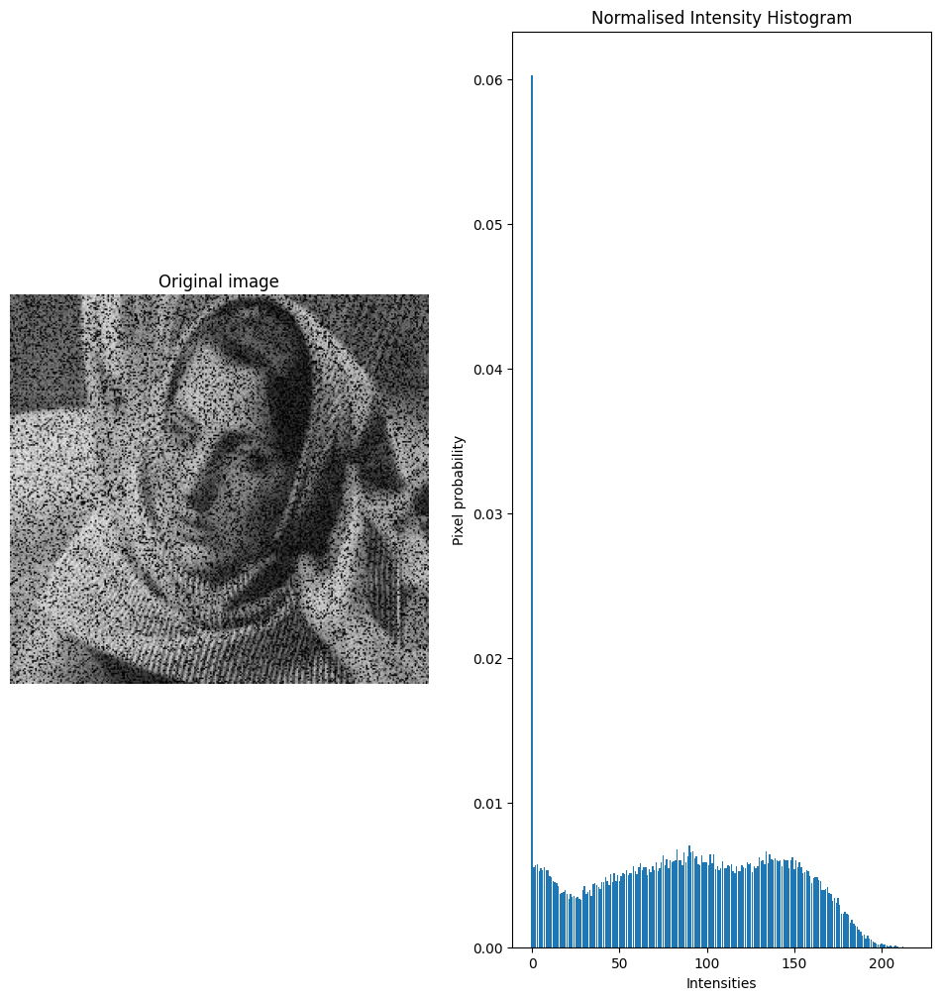

100%|██████████| 247/247 [00:00<00:00, 20903.39it/s]


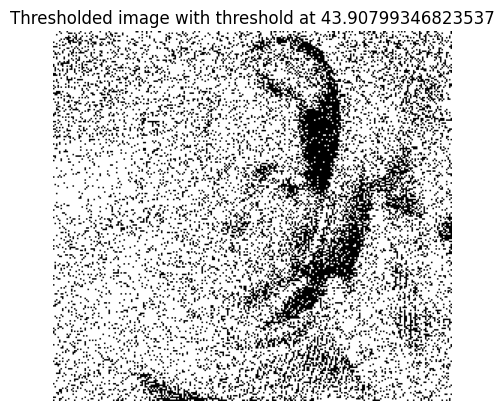

In [1299]:
Basic_Image_thresholding()

100%|██████████| 247/247 [00:00<00:00, 13645.67it/s]


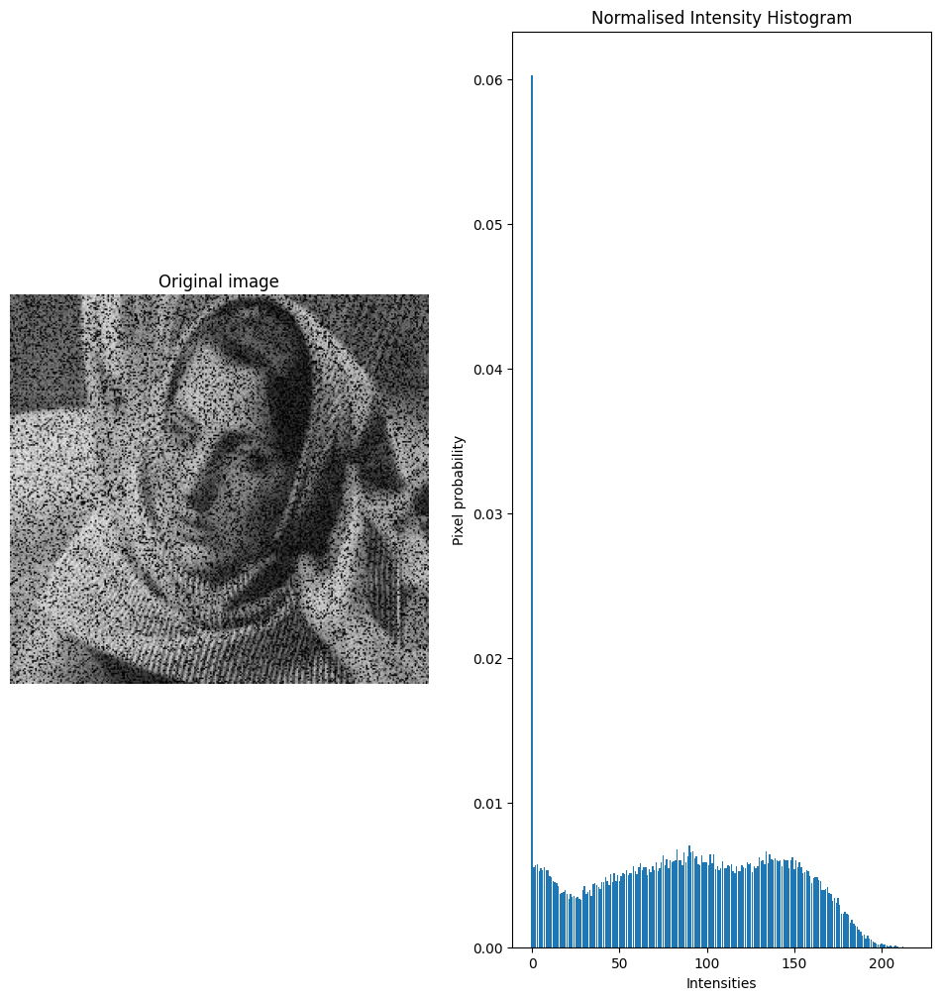

100%|██████████| 247/247 [00:00<00:00, 27097.54it/s]


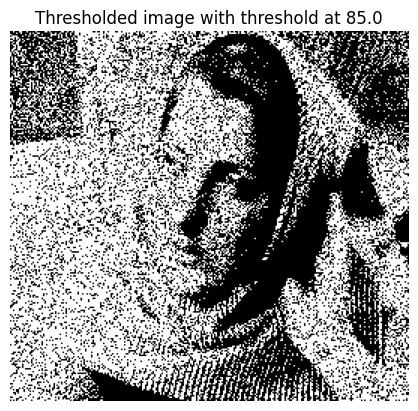

In [1300]:
Otsu_thresholding()